# Mini Project Notebook: Credit Card Clustering

## Dr. Prashanth Kannadaguli
### Founding Chief Research Architect & President
### Dhaarini AI-Tech Research Academy, Bengaluru, India

In [ ]:
# Load the required libraries
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans


## Dataset Exploration



Load the dataset "CreditCards.csv" into a Pandas DataFrame. Display the first 15 rows and all columns.

In [ ]:
#load dataset CreditCards.csv
df=pd.read_csv(r"/content/CreditCards.csv")
df.head(15)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
6,C10007,627.260806,1.000000,7091.01,6402.63,688.38,0.000000,1.000000,1.000000,1.000000,0.000000,0,64,13500.0,6354.314328,198.065894,1.000000,12
7,C10008,1823.652743,1.000000,436.20,0.00,436.20,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,2300.0,679.065082,532.033990,0.000000,12
8,C10009,1014.926473,1.000000,861.49,661.49,200.00,0.000000,0.333333,0.083333,0.250000,0.000000,0,5,7000.0,688.278568,311.963409,0.000000,12
9,C10010,152.225975,0.545455,1281.60,1281.60,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,3,11000.0,1164.770591,100.302262,0.000000,12


Determine the data types of each column in the DataFrame. Check for missing values and count the number of missing values in each column.

In [ ]:

print("Data types of each column:")
print(df.info())

print("count of missing values:")
print(df.isnull().sum())

Data types of each column:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non

Check the data types of all columns and ensure they are consistent with the expected types (e.g., numerical for quantities, categorical for identifiers).

In [ ]:
# Type your code here
print(df.dtypes)

CUST_ID                              object
BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object


Convert data types if necessary (e.g., convert object columns to numeric if appropriate).

In [ ]:
# Type your code here
#Not necessary as customer_id has an character 'C' in it

Calculate summary statistics (mean, median, mode, standard deviation, min, max, quartiles) for numerical columns.

In [ ]:

df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


Calculate the correlation between numerical variables. Visualize the correlation matrix using a heatmap.

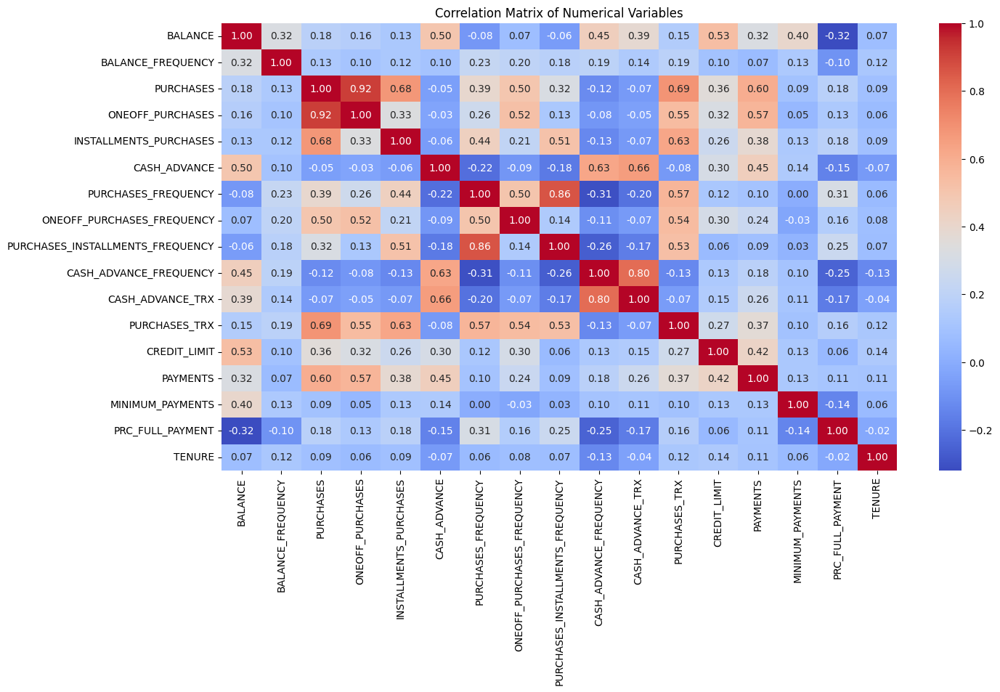

In [ ]:
# Select only numerical columns for correlation calculation
numericals_df = df.select_dtypes(include=np.number)

# Calculate the correlation matrix
correlation_matrix = numericals_df.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Variables')
plt.show()

Analyze the distribution of categorical variables (e.g., count the occurrences of different values in the CUST_ID column).

In [ ]:
# Type your code here
print(df['CUST_ID'].value_counts())

CUST_ID
C19190    1
C10001    1
C10002    1
C10003    1
C10004    1
         ..
C10026    1
C10027    1
C10028    1
C10029    1
C10030    1
Name: count, Length: 8950, dtype: int64


Identify outliers using box plots or statistical methods (e.g., IQR).

In [ ]:

# Calculate Q1, Q3, and IQR for numerical columns
Q1 = numericals_df.quantile(0.25)
Q3 = numericals_df.quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds for outlier detection
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = ((numericals_df < lower_bound) | (numericals_df > upper_bound)).any(axis=1)

print("Rows with outliers:")
print(df[outliers])

Rows with outliers:
     CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
1     C10002  3202.467416           0.909091       0.00              0.00   
2     C10003  2495.148862           1.000000     773.17            773.17   
3     C10004  1666.670542           0.636364    1499.00           1499.00   
5     C10006  1809.828751           1.000000    1333.28              0.00   
6     C10007   627.260806           1.000000    7091.01           6402.63   
...      ...          ...                ...        ...               ...   
8945  C19186    28.493517           1.000000     291.12              0.00   
8946  C19187    19.183215           1.000000     300.00              0.00   
8947  C19188    23.398673           0.833333     144.40              0.00   
8948  C19189    13.457564           0.833333       0.00              0.00   
8949  C19190   372.708075           0.666667    1093.25           1093.25   

      INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_F

Visualize the impact of outliers: Remove outliers and re-visualize the data to assess their impact on the overall distribution and relationships.

In [ ]:
# Remove rows with outliers
df_cleaned = df[~outliers].copy()

print("Original DataFrame shape:", df.shape)
print("DataFrame shape after removing outliers:", df_cleaned.shape)
df_cleaned.info()
df_cleaned.describe()

Original DataFrame shape: (8950, 18)
DataFrame shape after removing outliers: (2994, 18)
<class 'pandas.core.frame.DataFrame'>
Index: 2994 entries, 0 to 8760
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           2994 non-null   object 
 1   BALANCE                           2994 non-null   float64
 2   BALANCE_FREQUENCY                 2994 non-null   float64
 3   PURCHASES                         2994 non-null   float64
 4   ONEOFF_PURCHASES                  2994 non-null   float64
 5   INSTALLMENTS_PURCHASES            2994 non-null   float64
 6   CASH_ADVANCE                      2994 non-null   float64
 7   PURCHASES_FREQUENCY               2994 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        2994 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  2994 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            2994 non-null 

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,2994.000000,2994.000000,2994.000000,2994.000000,2994.000000,2994.000000,2994.000000,2994.000000,2994.000000,2994.000000,2994.000000,2994.000000,2994.000000,2994.000000,2945.000000,2994.000000,2994.0
mean,1203.715690,0.979049,375.938988,199.509319,176.681246,417.120996,0.392006,0.114980,0.301603,0.101453,1.777221,7.637943,3192.027995,815.443883,469.319733,0.028389,12.0
std,1025.943456,0.061752,443.534594,332.072754,256.328193,649.995147,0.372497,0.172705,0.374485,0.127583,2.423877,8.823880,2423.088548,696.084869,352.636672,0.068511,0.0
min,1.198223,0.727273,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,150.000000,0.000000,2.891346,0.000000,12.0
25%,379.893377,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1500.000000,351.734224,198.933162,0.000000,12.0
50%,1036.419148,1.000000,219.885000,0.000000,18.230000,38.941802,0.333333,0.000000,0.083333,0.083333,1.000000,5.000000,2500.000000,601.995631,351.642621,0.000000,12.0
75%,1678.253693,1.000000,574.552500,270.000000,291.225000,626.843430,0.750000,0.166667,0.583333,0.166667,3.000000,12.000000,4000.000000,1040.778351,634.569311,0.000000,12.0
max,4940.113918,1.000000,2315.860000,1443.330000,1170.490000,2780.106659,1.000000,0.750000,1.000000,0.500000,10.000000,41.000000,13500.000000,4138.243604,1801.264841,0.333333,12.0


Identify missing values in the dataset and calculate the percentage of missing data for each column.

In [ ]:
# Identify missing values and calculate their count
missing_values = df_cleaned.isnull().sum()

# Calculate the percentage of missing values
percentage_missing = (missing_values / len(df_cleaned)) * 100

print("Missing values count per column:")
print(missing_values)

print("\nPercentage of missing values per column:")
print(percentage_missing)

Missing values count per column:
CUST_ID                              0
BALANCE                              0
BALANCE_FREQUENCY                    0
PURCHASES                            0
ONEOFF_PURCHASES                     0
INSTALLMENTS_PURCHASES               0
CASH_ADVANCE                         0
PURCHASES_FREQUENCY                  0
ONEOFF_PURCHASES_FREQUENCY           0
PURCHASES_INSTALLMENTS_FREQUENCY     0
CASH_ADVANCE_FREQUENCY               0
CASH_ADVANCE_TRX                     0
PURCHASES_TRX                        0
CREDIT_LIMIT                         0
PAYMENTS                             0
MINIMUM_PAYMENTS                    49
PRC_FULL_PAYMENT                     0
TENURE                               0
dtype: int64

Percentage of missing values per column:
CUST_ID                             0.000000
BALANCE                             0.000000
BALANCE_FREQUENCY                   0.000000
PURCHASES                           0.000000
ONEOFF_PURCHASES              

Handle missing values (e.g., imputation, deletion) and outliers (e.g., capping, removal).

In [ ]:
# Impute missing values in 'MINIMUM_PAYMENTS' and 'CREDIT_LIMIT' with the median
df_cleaned['MINIMUM_PAYMENTS'].fillna(df_cleaned['MINIMUM_PAYMENTS'].median(), inplace=True)

# Verify that there are no more missing values in these columns
print("Missing values after imputation:")
print(df_cleaned['MINIMUM_PAYMENTS'].isnull().sum())

Missing values after imputation:
0


/tmp/ipython-input-3326885279.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_cleaned['MINIMUM_PAYMENTS'].fillna(df_cleaned['MINIMUM_PAYMENTS'].median(), inplace=True)


For categorical columns, impute missing values with the most frequent category or a new category.

In [ ]:

# Type your code here
#There are no missing values for categorical column that is cust_id

Explore the relationship between categorical variables and numerical variables (e.g., calculate the average BALANCE for different CUST_ID categories).

In [ ]:
# Type your code here
#it may not be possible because there exists only one unique identifier

Analyze the distribution of categorical variables conditioned on other categorical variables (e.g., how many customers with a high credit limit also have a high purchase frequency?).

In [ ]:
# Type your code here

Explore the relationship between categorical variables and time-based features (e.g., how does the average purchase amount change over time for different customer segments?).

In [ ]:
# Type your code here

Identify any patterns or trends in the data that might be relevant for customer segmentation (e.g., are there specific groups of customers with similar purchasing behaviors?).

In [ ]:
# Type your code here

Visualize the distribution of numerical variables using histograms or box plots to identify outliers or skewness in the data.

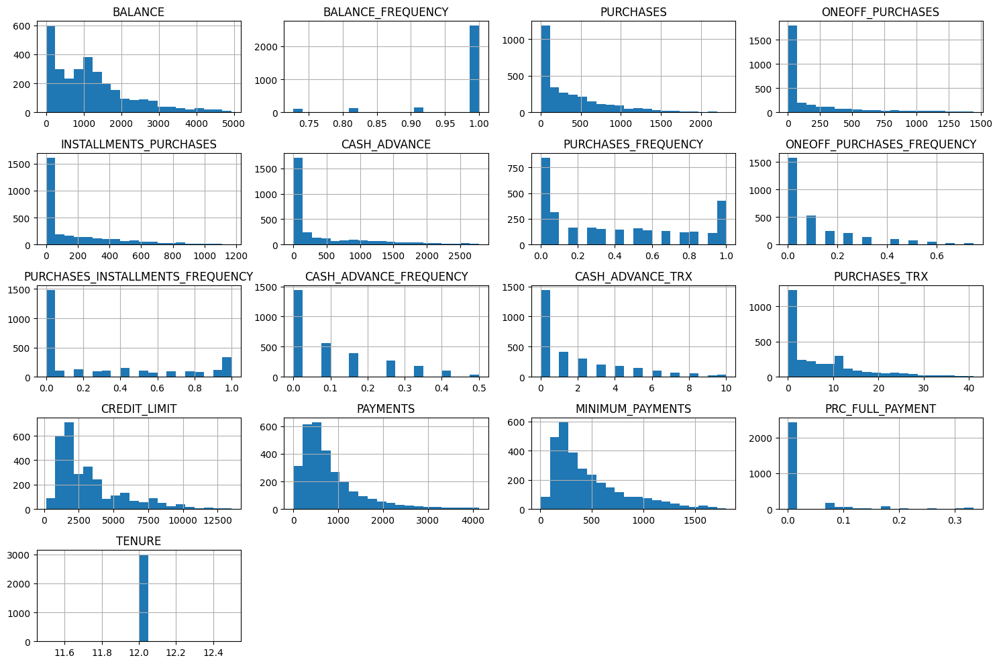

In [ ]:
# Type your code here
numerical_cols = df_cleaned.select_dtypes(include=np.number).columns

df_cleaned[numerical_cols].hist(figsize=(15, 10), bins=20)
plt.tight_layout()
plt.show()

## EDA

Visualize the distribution of numerical variables: Create histograms, box plots, and density plots to understand the shape, central tendency, and spread of variables like BALANCE, PURCHASES, and ONEOFF_PURCHASES.

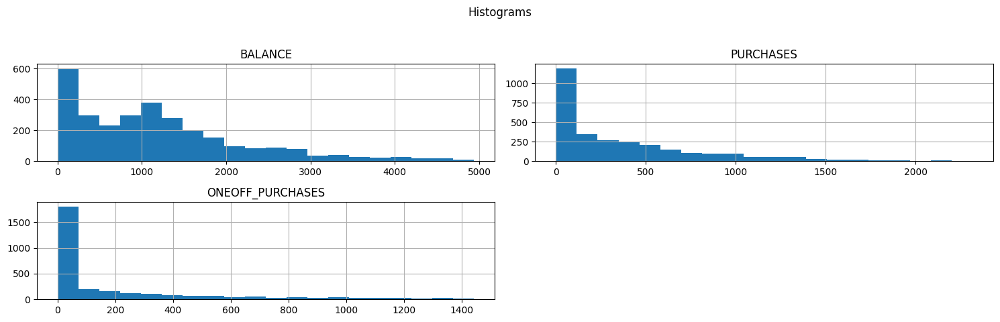

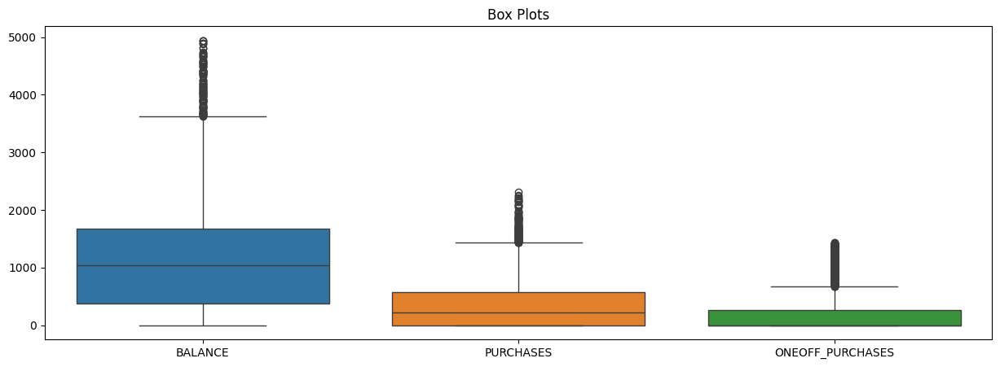

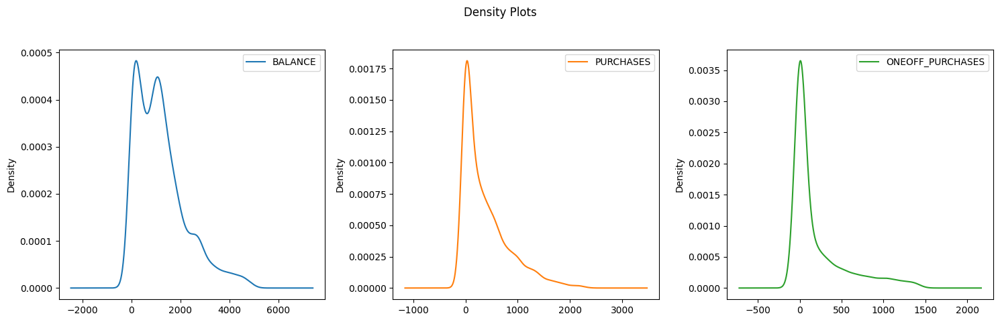

In [ ]:

columns = ['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES']

df_cleaned[columns].hist(figsize=(15, 5), bins=20)
plt.suptitle('Histograms')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


plt.figure(figsize=(15, 5))
sns.boxplot(data=df_cleaned[columns])
plt.title('Box Plots')
plt.show()

df_cleaned[columns].plot(kind='density', subplots=True, layout=(1, 3), figsize=(15, 5), sharex=False)
plt.suptitle('Density Plots')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Visualize the distribution of categorical variables: Create bar charts or pie charts to show the frequency of different categories in variables like CUST_ID, PURCHASES_FREQUENCY, and CASHADVANCEFREQUENCY.

Distribution of CUST_ID:
CUST_ID
C18999    1
C10001    1
C10005    1
C10008    1
C10009    1
         ..
C10068    1
C10070    1
C10072    1
C10081    1
C10084    1
Name: count, Length: 2994, dtype: int64


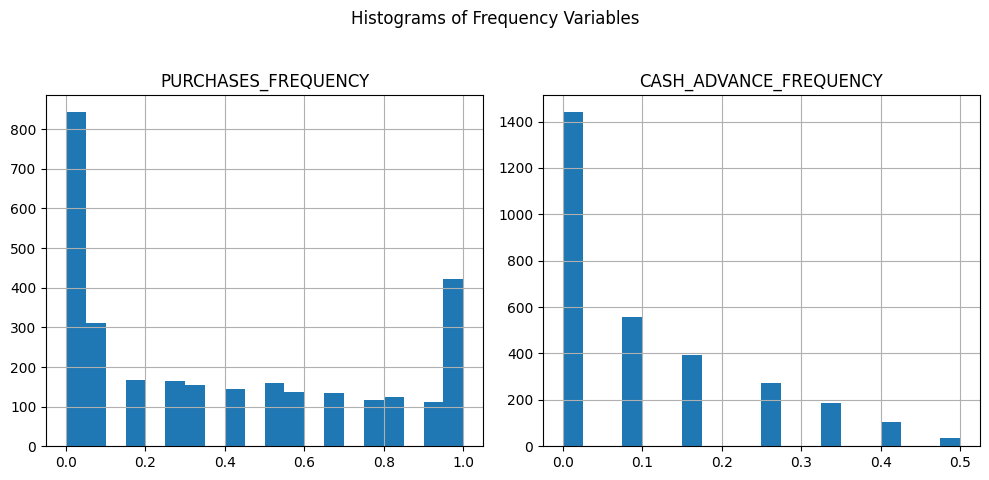

In [ ]:

print("Distribution of CUST_ID:")
print(df_cleaned['CUST_ID'].value_counts())

# Visualize the distribution of PURCHASES_FREQUENCY and CASH_ADVANCE_FREQUENCY using histograms
freq_cols = ['PURCHASES_FREQUENCY', 'CASH_ADVANCE_FREQUENCY']

df_cleaned[freq_cols].hist(figsize=(10, 5), bins=20)
plt.suptitle('Histograms of Frequency Variables')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Visualize the relationship between numerical variables: Create scatter plots to examine the correlation between pairs of numerical variables, such as BALANCE and PURCHASES.

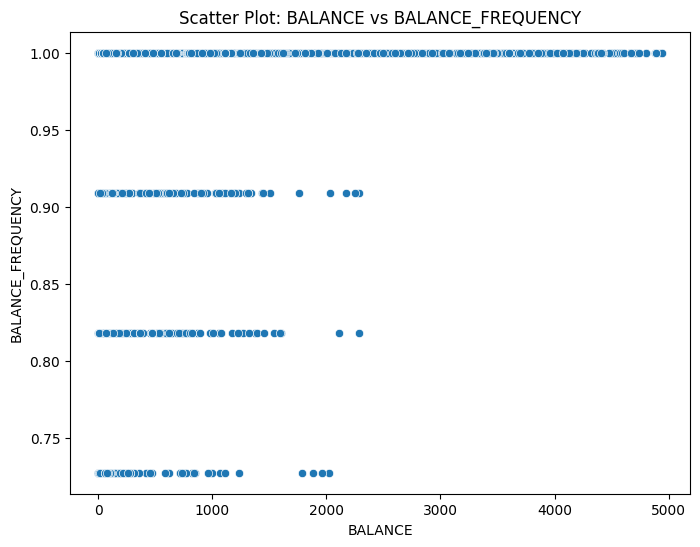

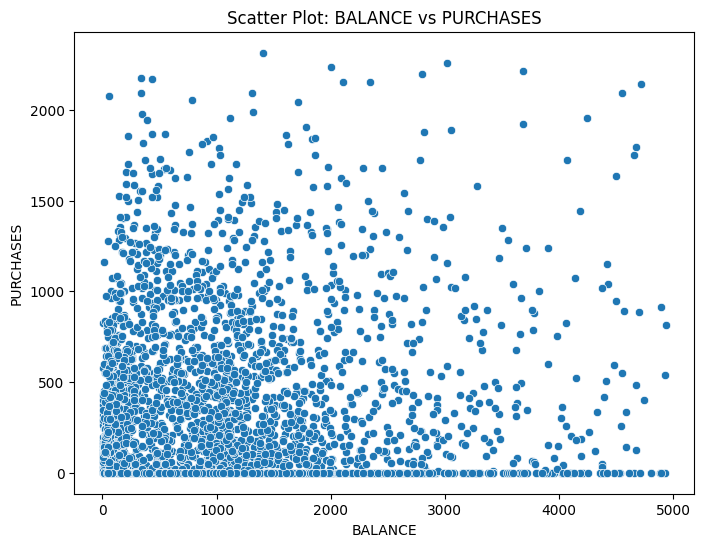

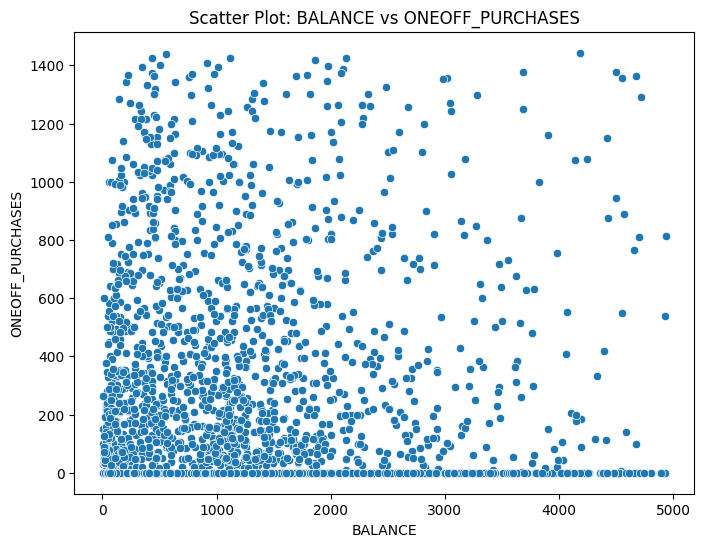

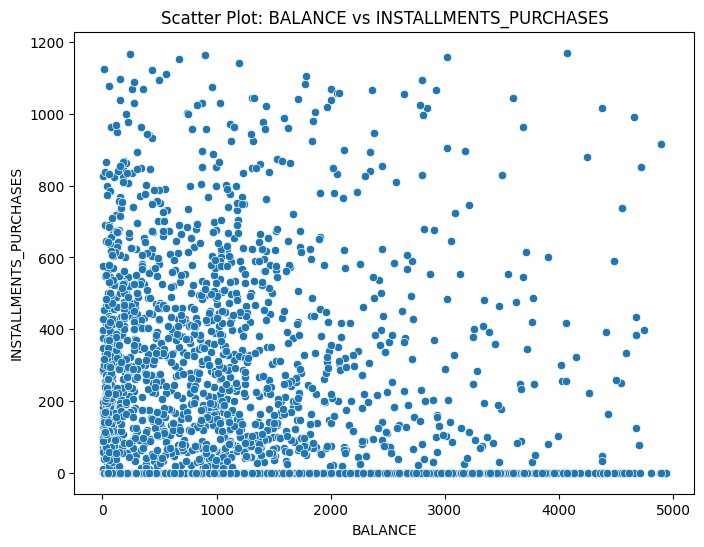

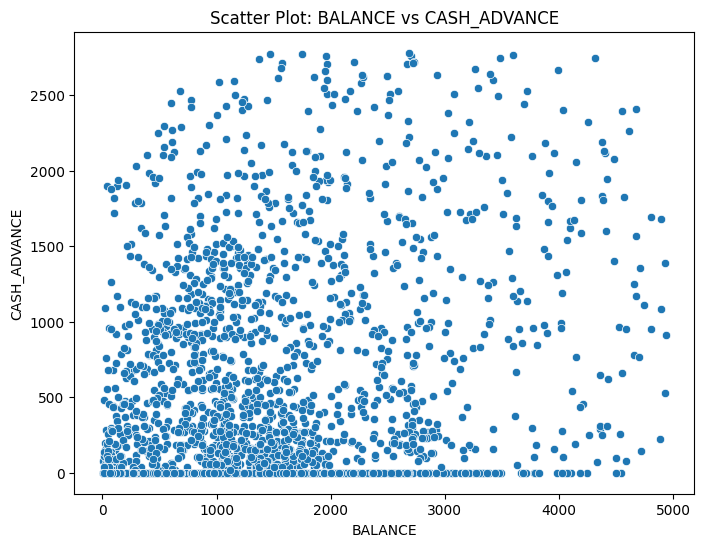

...

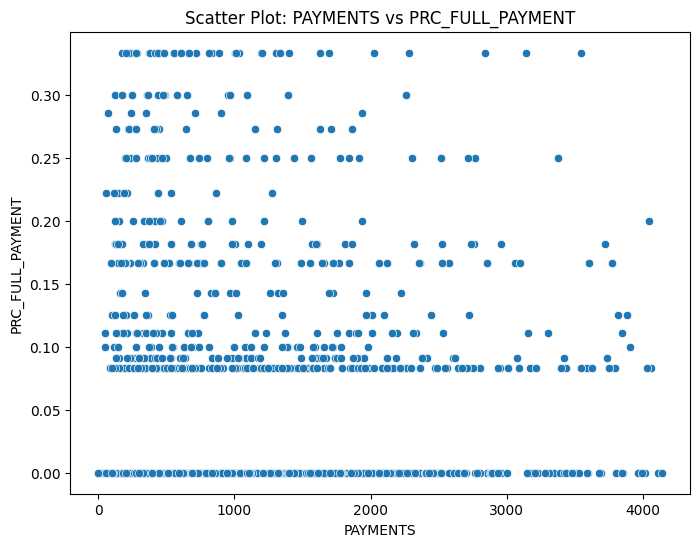

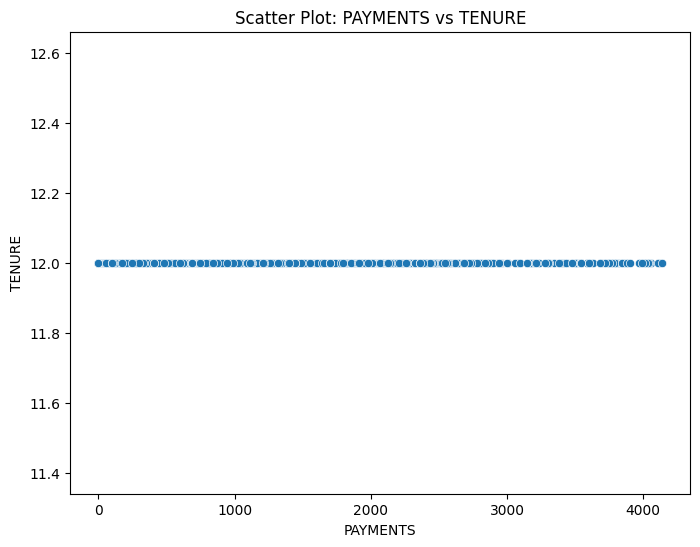

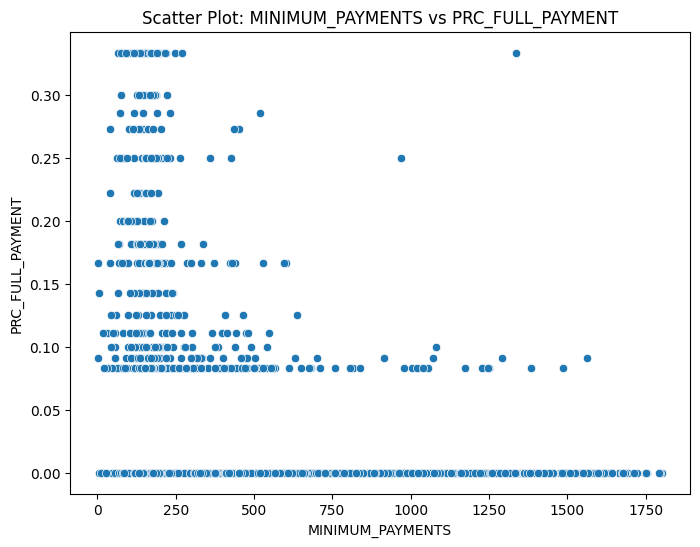

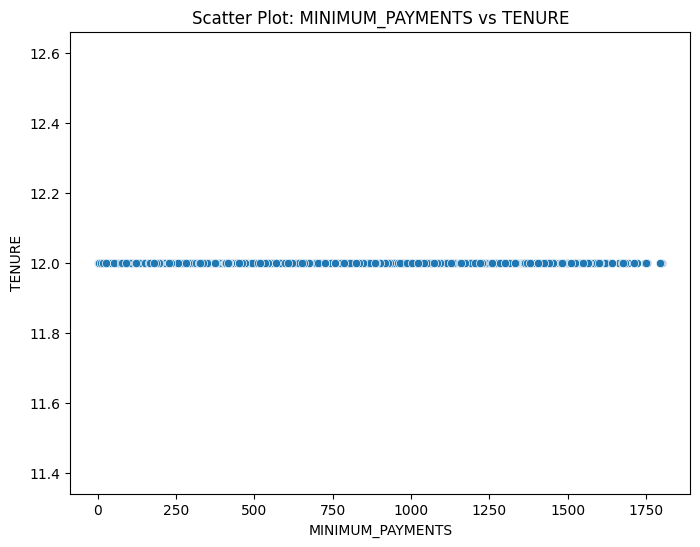

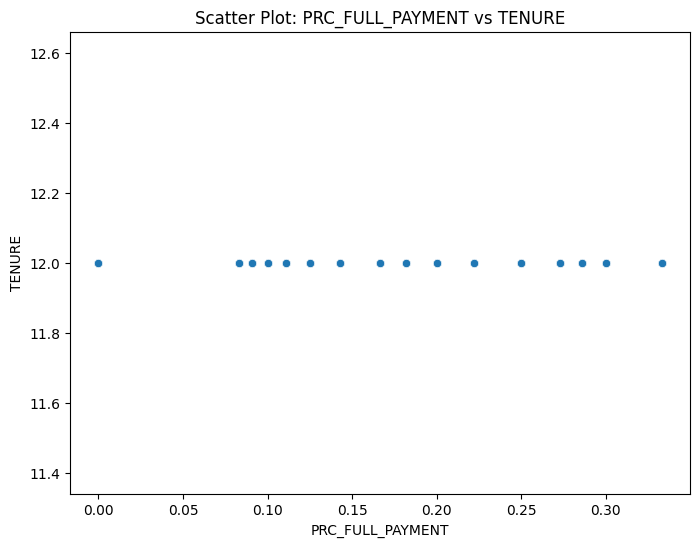

In [ ]:

numerical_cols = df_cleaned.select_dtypes(include=np.number).columns

for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(data=df_cleaned, x=numerical_cols[i], y=numerical_cols[j])
        plt.title(f'Scatter Plot: {numerical_cols[i]} vs {numerical_cols[j]}')
        plt.show()

Visualize the relationship between categorical and numerical variables: Create box plots or violin plots to compare the distribution of a numerical variable across different categories of a categorical variable (e.g., compare the distribution of PURCHASES for different CUST_ID categories).

In [ ]:
# cannot be compared as CUST_ID is unique

Visualize the relationship between multiple variables: Create pair plots or correlation matrices to explore the relationships between multiple variables simultaneously.

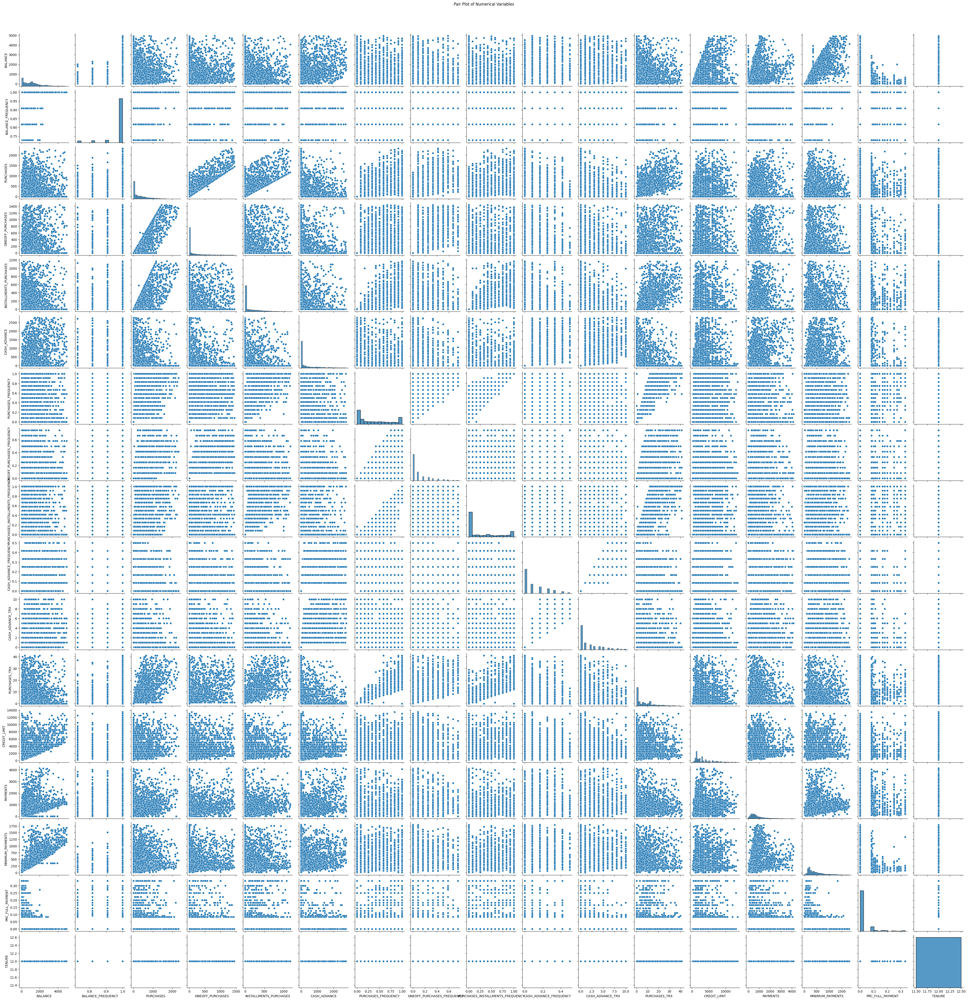

In [ ]:
# Select only numerical columns for the pair plot
columns = df_cleaned.select_dtypes(include=np.number).columns

# Create a pair plot
sns.pairplot(df_cleaned[columns])
plt.suptitle('Pair Plot of Numerical Variables', y=1.02)
plt.show()

Visualize interactions between variables: Create interaction plots to examine how the relationship between two variables changes depending on the value of a third variable.

In [ ]:
#cannot be visualized

Visualize trends over time: Create line charts to plot numerical variables against time (if applicable), such as the evolution of BALANCE or PURCHASES over the last 6 months.

In [ ]:
#not applicable

Visualize seasonal patterns: Create seasonal decomposition plots to identify seasonal trends, cyclical patterns, and residuals in time-based data.

In [ ]:
#not applicable

Visualize the distribution of credit limits: Create a histogram or box plot to understand the distribution of credit limits among customers. Are there any significant differences in credit limits between different customer segments?

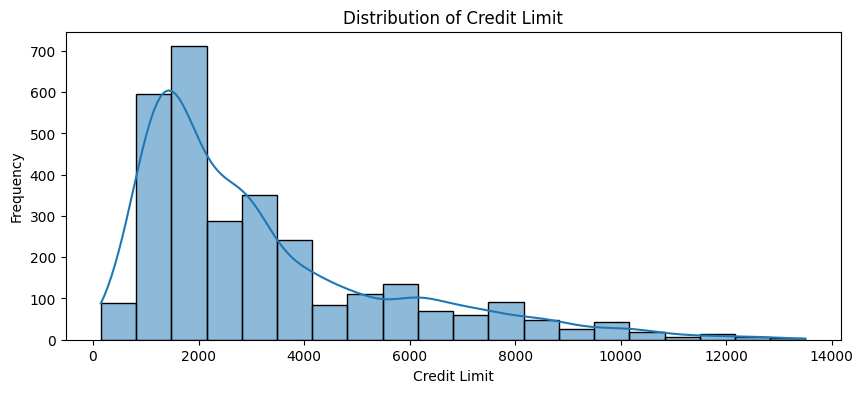

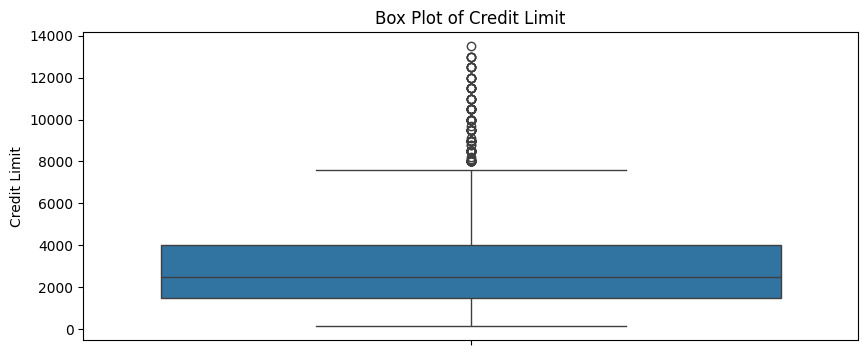

In [ ]:

plt.figure(figsize=(10, 4))
sns.histplot(data=df_cleaned, x='CREDIT_LIMIT', bins=20, kde=True)
plt.title('Distribution of Credit Limit')
plt.xlabel('Credit Limit')
plt.ylabel('Frequency')
plt.show()

# Visualize the distribution of CREDIT_LIMIT using a box plot
plt.figure(figsize=(10, 4))
sns.boxplot(data=df_cleaned, y='CREDIT_LIMIT')
plt.title('Box Plot of Credit Limit')
plt.ylabel('Credit Limit')
plt.show()

Visualize the relationship between payment patterns and delinquency: Create a scatter plot to examine the relationship between the percentage of full payments made (PRCFULLPAYMENT) and the number of times the minimum payment was not made (MINIMUM_PAYMENTS). Are there any patterns indicating which customers are more likely to be delinquent?

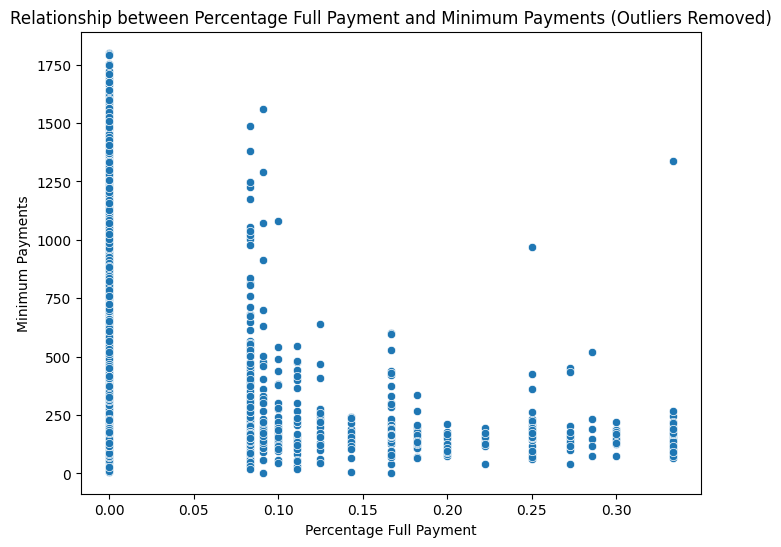

In [ ]:

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_cleaned, x='PRC_FULL_PAYMENT', y='MINIMUM_PAYMENTS')
plt.title('Relationship between Percentage Full Payment and Minimum Payments (Outliers Removed)')
plt.xlabel('Percentage Full Payment')
plt.ylabel('Minimum Payments')
plt.show()

Visualize the distribution of tenure: Create a histogram or bar chart to understand the distribution of credit card tenure among customers. Are there any significant differences in tenure between different customer segments?

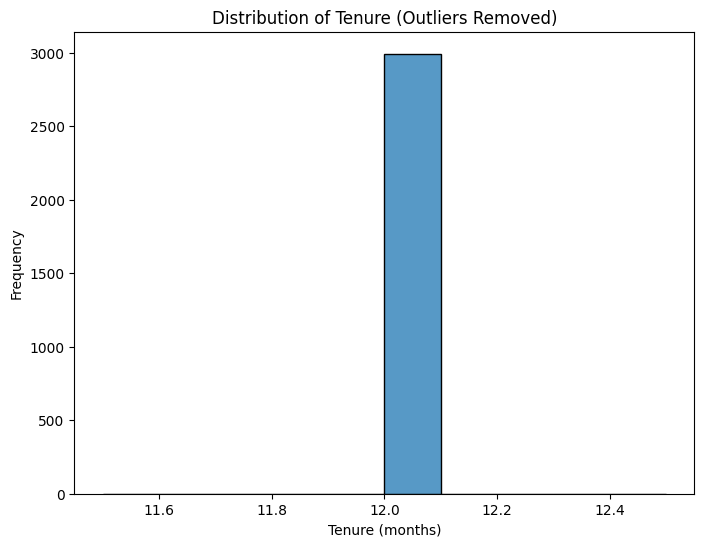

In [ ]:

plt.figure(figsize=(8, 6))
sns.histplot(data=df_cleaned, x='TENURE', bins=10, kde=False)
plt.title('Distribution of Tenure (Outliers Removed)')
plt.xlabel('Tenure (months)')
plt.ylabel('Frequency')
plt.show()

Visualize the relationship between purchase frequency and purchase amount: Create a scatter plot to examine the relationship between the frequency of purchases (PURCHASES_FREQUENCY) and the total purchase amount (PURCHASES). Are there any patterns indicating which customers are more likely to make larger purchases?

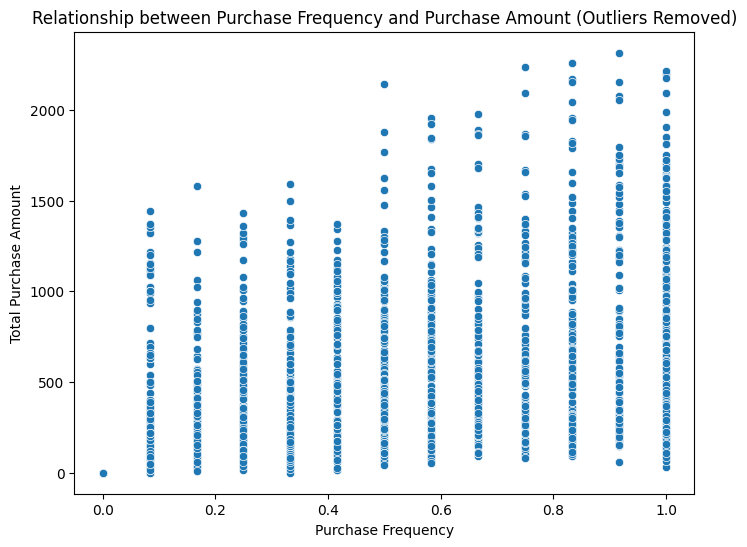

In [ ]:

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_cleaned, x='PURCHASES_FREQUENCY', y='PURCHASES')
plt.title('Relationship between Purchase Frequency and Purchase Amount (Outliers Removed)')
plt.xlabel('Purchase Frequency')
plt.ylabel('Total Purchase Amount')
plt.show()

Visualize the relationship between cash advance usage and purchase behavior: Create a scatter plot to examine the relationship between the amount of cash advances (CASH_ADVANCE) and the total purchase amount (PURCHASES). Are there any patterns indicating which customers are more likely to use cash advances and how this affects their purchase behavior?

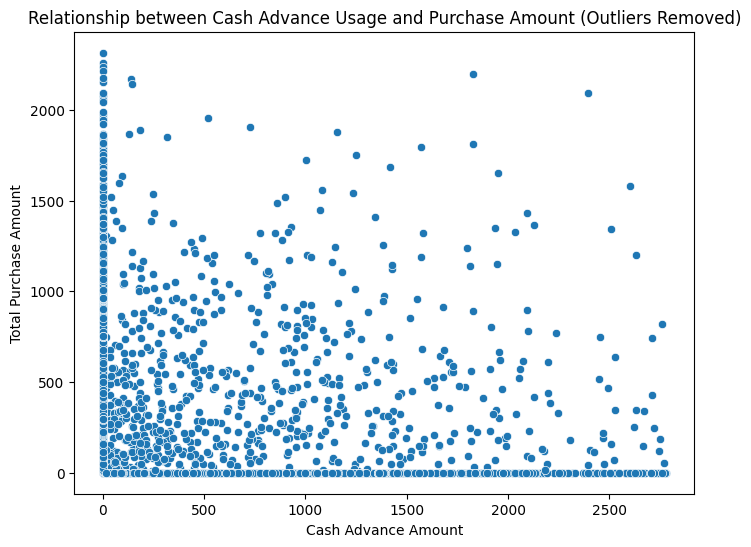

In [ ]:

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_cleaned, x='CASH_ADVANCE', y='PURCHASES')
plt.title('Relationship between Cash Advance Usage and Purchase Amount (Outliers Removed)')
plt.xlabel('Cash Advance Amount')
plt.ylabel('Total Purchase Amount')
plt.show()

## Data Preprocessing

Scale numerical variables to a common range (e.g., 0-1 or -1 to 1) using techniques like min-max scaling or standardization to improve model performance and prevent numerical instability.

In [ ]:
from sklearn.preprocessing import StandardScaler


numerical_cols_for_scaling = df_cleaned.select_dtypes(include=np.number).columns.drop('TENURE', errors='ignore')

# StandardScaler
scaler = StandardScaler()

# Scaling the numerical columns
df_scaled = df_cleaned.copy()
df_scaled[numerical_cols_for_scaling] = scaler.fit_transform(df_cleaned[numerical_cols_for_scaling])

# Display the first few rows of the scaled DataFrame
df_scaled.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,-1.133600,-2.605506,-0.632613,-0.600900,-0.317151,-0.641837,-0.605044,-0.665870,-0.582952,-0.795323,-0.733337,-0.639048,-0.904793,-0.881709,-0.936816,-0.414442,12
4,C10005,-0.376303,0.339335,-0.811660,-0.552710,-0.689393,-0.641837,-0.828798,-0.183273,-0.805516,-0.795323,-0.733337,-0.752396,-0.822240,-0.197005,-0.636010,-0.414442,12
7,C10008,0.604361,0.339335,0.135888,-0.600900,1.012616,-0.641837,1.632485,-0.665870,1.865263,-0.795323,-0.733337,0.494429,-0.368198,-0.195955,0.184687,-0.414442,12
8,C10009,-0.184046,0.339335,1.094914,1.391436,0.090987,-0.641837,-0.157540,-0.183273,-0.137821,-0.795323,-0.733337,-0.299005,1.571799,-0.182717,-0.444089,-0.414442,12
14,C10015,1.529635,0.339335,-0.847739,-0.600900,-0.689393,-0.108188,-1.052550,-0.665870,-0.805516,-0.142048,-0.320706,-0.865744,-0.079263,-0.014075,1.493061,-0.414442,12


Convert categorical variables to numerical representations using techniques like one-hot encoding or label encoding, depending on the nature of the variables.

In [ ]:
# Cannot be converted as they wont be having an order if they are converted

## Feature Engineering

Combine existing features to capture interactions between them (e.g., multiply BALANCE and PURCHASES_FREQUENCY to create a new feature representing the total spending per unit time).

In [ ]:

df_scaled['TOTAL_SPENDING_PER_UNIT_TIME'] = df_scaled['BALANCE'] * df_scaled['PURCHASES_FREQUENCY']

display(df_scaled.head())

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,TOTAL_SPENDING_PER_UNIT_TIME
0,C10001,-1.133600,-2.605506,-0.632613,-0.600900,-0.317151,-0.641837,-0.605044,-0.665870,-0.582952,-0.795323,-0.733337,-0.639048,-0.904793,-0.881709,-0.936816,-0.414442,12,0.685877
4,C10005,-0.376303,0.339335,-0.811660,-0.552710,-0.689393,-0.641837,-0.828798,-0.183273,-0.805516,-0.795323,-0.733337,-0.752396,-0.822240,-0.197005,-0.636010,-0.414442,12,0.311880
7,C10008,0.604361,0.339335,0.135888,-0.600900,1.012616,-0.641837,1.632485,-0.665870,1.865263,-0.795323,-0.733337,0.494429,-0.368198,-0.195955,0.184687,-0.414442,12,0.986611
8,C10009,-0.184046,0.339335,1.094914,1.391436,0.090987,-0.641837,-0.157540,-0.183273,-0.137821,-0.795323,-0.733337,-0.299005,1.571799,-0.182717,-0.444089,-0.414442,12,0.028995
14,C10015,1.529635,0.339335,-0.847739,-0.600900,-0.689393,-0.108188,-1.052550,-0.665870,-0.805516,-0.142048,-0.320706,-0.865744,-0.079263,-0.014075,1.493061,-0.414442,12,-1.610018


Derive new features by calculating ratios or percentages between existing features (e.g., calculate the percentage of credit limit used by dividing BALANCE by CREDIT_LIMIT).

In [ ]:

df_scaled['PERCENTAGE_CREDIT_LIMIT_USED'] = df_scaled['BALANCE'] / (df_scaled['CREDIT_LIMIT'] + 1e-6)

display(df_scaled.head())

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,TOTAL_SPENDING_PER_UNIT_TIME,PERCENTAGE_CREDIT_LIMIT_USED
0,C10001,-1.133600,-2.605506,-0.632613,-0.600900,-0.317151,-0.641837,-0.605044,-0.665870,-0.582952,-0.795323,-0.733337,-0.639048,-0.904793,-0.881709,-0.936816,-0.414442,12,0.685877,1.252884
4,C10005,-0.376303,0.339335,-0.811660,-0.552710,-0.689393,-0.641837,-0.828798,-0.183273,-0.805516,-0.795323,-0.733337,-0.752396,-0.822240,-0.197005,-0.636010,-0.414442,12,0.311880,0.457657
7,C10008,0.604361,0.339335,0.135888,-0.600900,1.012616,-0.641837,1.632485,-0.665870,1.865263,-0.795323,-0.733337,0.494429,-0.368198,-0.195955,0.184687,-0.414442,12,0.986611,-1.641407
8,C10009,-0.184046,0.339335,1.094914,1.391436,0.090987,-0.641837,-0.157540,-0.183273,-0.137821,-0.795323,-0.733337,-0.299005,1.571799,-0.182717,-0.444089,-0.414442,12,0.028995,-0.117092
14,C10015,1.529635,0.339335,-0.847739,-0.600900,-0.689393,-0.108188,-1.052550,-0.665870,-0.805516,-0.142048,-0.320706,-0.865744,-0.079263,-0.014075,1.493061,-0.414442,12,-1.610018,-19.298587


Extract time-based features from dates or timestamps (e.g., create features for day of week, month, or year).

In [ ]:
#Not applicable

Create new features by grouping data and calculating summary statistics within each group (e.g., calculate the average purchase amount for each customer segment).

In [ ]:
# can be done after clustering

Leverage domain knowledge to create new features that are relevant to the problem at hand (e.g., create a feature indicating whether a customer has made a purchase in the last 30 days).

In [ ]:
# Requires time based data

Create polynomial features by raising existing numerical features to powers (e.g., create features for BALANCE^2 and PURCHASES^2).

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

selected_columns = ['BALANCE', 'PURCHASES']
poly = PolynomialFeatures(degree=2, include_bias=False)

poly_data = poly.fit_transform(df_scaled[selected_columns])
poly_column_names = poly.get_feature_names_out(selected_columns)

df_poly = pd.DataFrame(poly_data, columns=poly_column_names, index=df_scaled.index)

df_scaled = df_scaled.drop(columns=selected_columns, errors='ignore')
df_scaled = pd.concat([df_scaled, df_poly], axis=1)

display(df_scaled.head())


,CUST_ID,BALANCE_FREQUENCY,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,...,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,TOTAL_SPENDING_PER_UNIT_TIME,PERCENTAGE_CREDIT_LIMIT_USED,BALANCE,PURCHASES,BALANCE^2,BALANCE PURCHASES,PURCHASES^2
0,C10001,-2.605506,-0.600900,-0.317151,-0.641837,-0.605044,-0.665870,-0.582952,-0.795323,-0.733337,...,-0.936816,-0.414442,12,0.685877,1.252884,-1.133600,-0.632613,1.285048,0.717130,0.400199
4,C10005,0.339335,-0.552710,-0.689393,-0.641837,-0.828798,-0.183273,-0.805516,-0.795323,-0.733337,...,-0.636010,-0.414442,12,0.311880,0.457657,-0.376303,-0.811660,0.141604,0.305430,0.658791
7,C10008,0.339335,-0.600900,1.012616,-0.641837,1.632485,-0.665870,1.865263,-0.795323,-0.733337,...,0.184687,-0.414442,12,0.986611,-1.641407,0.604361,0.135888,0.365253,0.082126,0.018466
8,C10009,0.339335,1.391436,0.090987,-0.641837,-0.157540,-0.183273,-0.137821,-0.795323,-0.733337,...,-0.444089,-0.414442,12,0.028995,-0.117092,-0.184046,1.094914,0.033873,-0.201514,1.198836
14,C10015,0.339335,-0.600900,-0.689393,-0.108188,-1.052550,-0.665870,-0.805516,-0.142048,-0.320706,...,1.493061,-0.414442,12,-1.610018,-19.298587,1.529635,-0.847739,2.339784,-1.296732,0.718662


Calculate the difference between time-based features (e.g., calculate the difference between the last purchase date and the last payment date).

In [ ]:
# not applicable

Group data by specific criteria and calculate custom aggregations (e.g., calculate the median purchase amount for each customer segment).

In [ ]:
import pandas as pd

def segment_customer(limit):
    if limit < 2000:
        return "Low"
    elif limit < 5000:
        return "Medium"
    else:
        return "High"

df['Customer_Segment'] = df['CREDIT_LIMIT'].apply(segment_customer)

median_purchases = df.groupby('Customer_Segment')['PURCHASES'].median().reset_index()

print(median_purchases)


  Customer_Segment  PURCHASES
0             High    721.055
1              Low    212.000
2           Medium    336.000


Use feature selection techniques (e.g., correlation analysis, recursive feature elimination) to identify the most important features and remove redundant or irrelevant ones.

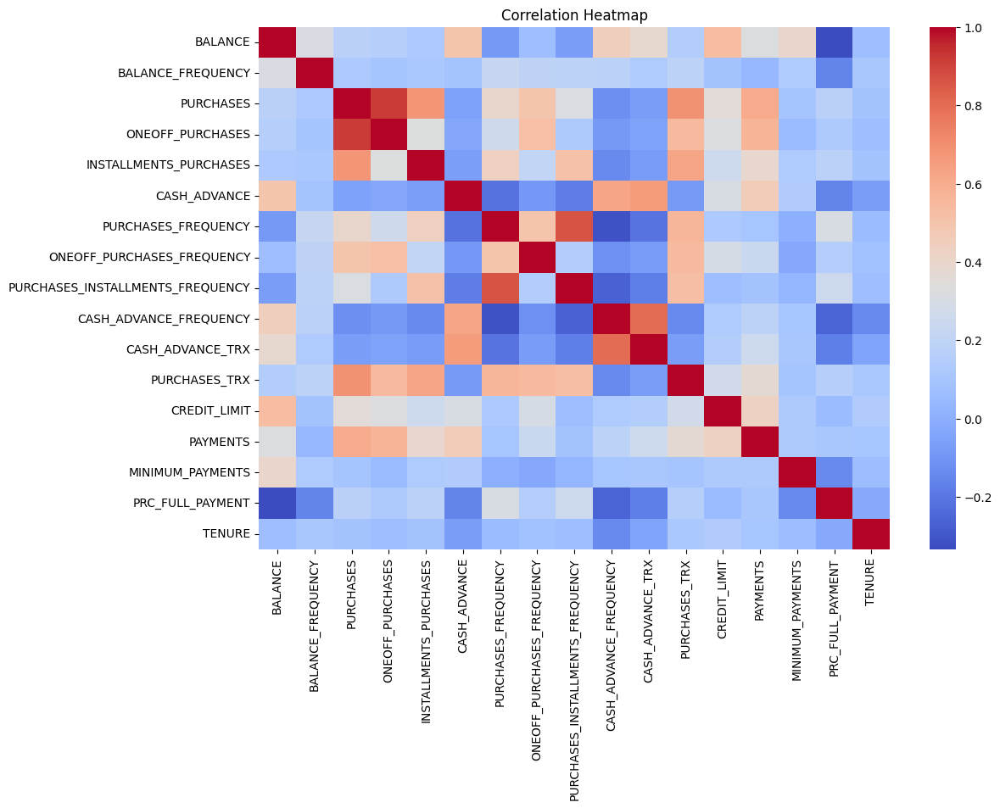

Features removed due to high correlation: ['ONEOFF_PURCHASES', 'PURCHASES_INSTALLMENTS_FREQUENCY']
Remaining features after correlation filtering: ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']
Top features selected by RFE: ['BALANCE_FREQUENCY', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'PRC_FULL_PAYMENT', 'TENURE']


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE

df_numeric = df.select_dtypes(include=[np.number]).dropna()

corr_matrix = df_numeric.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=False, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

# Remove features with correlation > 0.85
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
high_corr_features = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.85)]
df_corr_filtered = df_numeric.drop(columns=high_corr_features, errors='ignore')

print("Features removed due to high correlation:", high_corr_features)
print("Remaining features after correlation filtering:", df_corr_filtered.columns.tolist())
X = df_corr_filtered.drop(columns=['BALANCE'], errors='ignore')  # Example: predicting BALANCE
y = df_corr_filtered['BALANCE']

model = LinearRegression()
rfe = RFE(model, n_features_to_select=8)  # Select top 8 features
fit = rfe.fit(X, y)

# Get selected features
selected_features = X.columns[fit.support_].tolist()
print("Top features selected by RFE:", selected_features)

## PCA

Standardize the numerical features to ensure they have a mean of 0 and a standard deviation of 1, as PCA is sensitive to the scale of the variables.

In [ ]:
numeric_cols = df.select_dtypes(include=[np.number]).columns
numeric_cols = [col for col in numeric_cols if col != 'CUST_ID']

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform numeric columns
df_scaled = df.copy()
df_scaled[numeric_cols] = scaler.fit_transform(df[numeric_cols])

print("First 5 rows after standardization:")
print(df_scaled.head())

First 5 rows after standardization:
  CUST_ID   BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
0  C10001 -0.731989          -0.249434  -0.424900         -0.356934   
1  C10002  0.786961           0.134325  -0.469552         -0.356934   
2  C10003  0.447135           0.518084  -0.107668          0.108889   
3  C10004  0.049099          -1.016953   0.232058          0.546189   
4  C10005 -0.358775           0.518084  -0.462063         -0.347294   

   INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
0               -0.349079     -0.466786            -0.806490   
1               -0.454576      2.605605            -1.221758   
2               -0.454576     -0.466786             1.269843   
3               -0.454576     -0.368653            -1.014125   
4               -0.454576     -0.466786            -1.014125   

   ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  \
0                   -0.678661                         -0.707313   
1                 

Compute the covariance matrix of the standardized data to measure the relationships between the variables.

In [ ]:

numerical_cols_scaled = df_scaled.select_dtypes(include=np.number)

# Compute the covariance matrix
covariance_matrix = numerical_cols_scaled.cov()

print("Covariance Matrix of Standardized Numerical Variables:")
print(covariance_matrix)

Covariance Matrix of Standardized Numerical Variables:
                                   BALANCE  BALANCE_FREQUENCY  PURCHASES  \
BALANCE                           1.000112           0.322448   0.181281   
BALANCE_FREQUENCY                 0.322448           1.000112   0.133689   
PURCHASES                         0.181281           0.133689   1.000112   
ONEOFF_PURCHASES                  0.164368           0.104335   0.916947   
INSTALLMENTS_PURCHASES            0.126483           0.124306   0.679972   
CASH_ADVANCE                      0.496747           0.099399  -0.051480   
PURCHASES_FREQUENCY              -0.077952           0.229741   0.393061   
ONEOFF_PURCHASES_FREQUENCY        0.073174           0.202438   0.498485   
PURCHASES_INSTALLMENTS_FREQUENCY -0.063193           0.176099   0.315602   
CASH_ADVANCE_FREQUENCY            0.449268           0.191894  -0.120157   
CASH_ADVANCE_TRX                  0.385195           0.141571  -0.067183   
PURCHASES_TRX                    

Decompose the covariance matrix into its eigenvectors and eigenvalues, which represent the principal components and their corresponding variances.

In [ ]:


numerical_cols_scaled = df_scaled.select_dtypes(include=np.number)


covariance_matrix = numerical_cols_scaled.cov()

eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

print("Eigenvalues:")
print(eigenvalues)
print("\nEigenvectors:")
print(eigenvectors)

Eigenvalues:
[4.64032427e+00 3.45421460e+00 1.49568491e+00 1.27331724e+00
 1.06521943e+00 9.77584917e-01 8.30693241e-01 7.20487023e-01
 6.50127923e-01 5.23657592e-01 4.03254787e-01 3.00919183e-01
 2.41996434e-01 2.06946661e-01 1.72070422e-01 4.53934268e-02
 1.16500681e-05]

Eigenvectors:
[[-1.01494398e-01 -4.04087434e-01  1.61445397e-01  2.82898703e-01
  -4.68539158e-02 -4.01945400e-02 -2.54736398e-01 -1.60710864e-01
   1.31403219e-01  3.08891854e-02 -1.46152198e-01  4.74851810e-01
  -5.30012781e-01 -1.74507282e-01  2.22105310e-01  4.86529115e-03
  -4.08655709e-05]
 [-1.20162342e-01 -1.30461540e-01  4.20222058e-01  1.44742541e-01
   4.86526571e-01 -3.49217406e-02  1.06147996e-01  2.69962182e-01
   6.16732484e-01 -8.12876547e-02  1.18410641e-01 -9.35093417e-02
   1.89071720e-01  4.19858590e-02  3.95112907e-02  1.11991804e-02
  -8.58213929e-06]
 [-4.11633757e-01 -4.04978040e-02 -2.57692620e-01  4.06651123e-02
  -3.17899047e-02 -1.76621124e-01  2.02983122e-01  2.11639966e-02
   1.04914855

Choose the principal components with the highest eigenvalues, as these components explain the most variance in the data. The number of components to keep can be determined based on the desired level of dimensionality reduction or by analyzing the scree plot (a plot of the eigenvalues in descending order).

Explained Variance Ratio for each Principal Component:
[2.72929688e-01 2.03166343e-01 8.79716137e-02 7.48926273e-02
 6.26529506e-02 5.74985563e-02 4.88588369e-02 4.23768441e-02
 3.82385369e-02 3.07999387e-02 2.37182138e-02 1.76991464e-02
 1.42334904e-02 1.21719700e-02 1.01206562e-02 2.66990259e-03
 6.85221390e-07]

Cumulative Explained Variance:
[0.27292969 0.47609603 0.56406764 0.63896027 0.70161322 0.75911178
 0.80797062 0.85034746 0.888586   0.91938594 0.94310415 0.9608033
 0.97503679 0.98720876 0.99732941 0.99999931 1.        ]


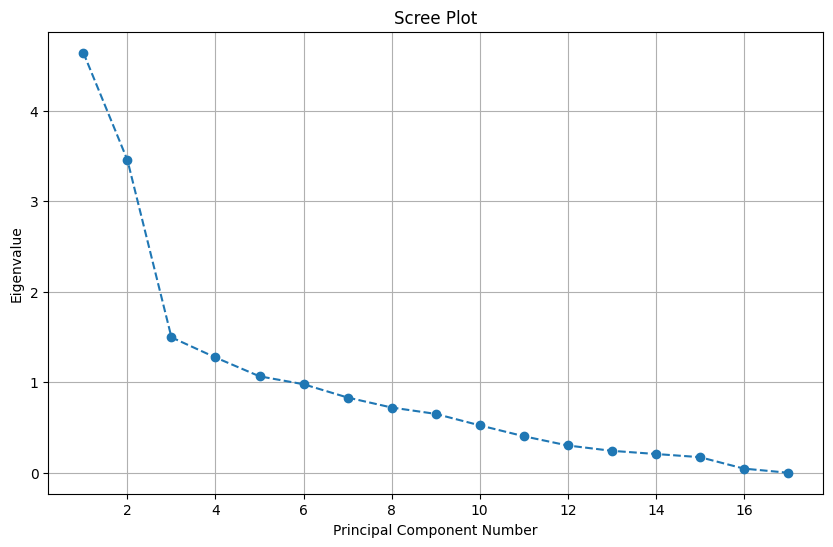

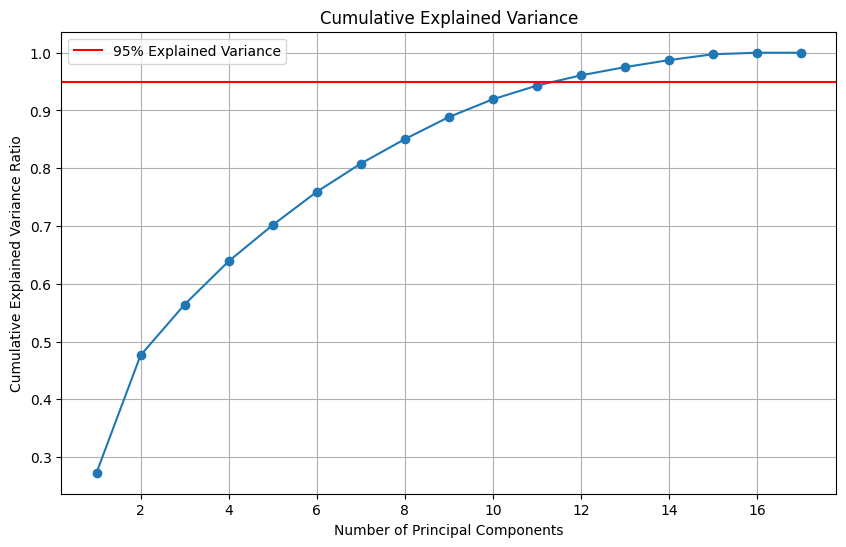

In [ ]:
# Calculate the explained variance ratio for each principal component
explained_variance_ratio = eigenvalues / np.sum(eigenvalues)

print("Explained Variance Ratio for each Principal Component:")
print(explained_variance_ratio)

# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

print("\nCumulative Explained Variance:")
print(cumulative_explained_variance)

# Create a scree plot
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o', linestyle='--')
plt.title('Scree Plot')
plt.xlabel('Principal Component Number')
plt.ylabel('Eigenvalue')
plt.grid(True)
plt.show()

# Plot the cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='-')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.axhline(y=0.95, color='r', linestyle='-', label='95% Explained Variance')
plt.legend()
plt.grid(True)
plt.show()

Project the original data onto the selected principal components to obtain the reduced-dimensional representation. The resulting features are the principal components, which are uncorrelated and capture the most important information in the data.

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

# Based on the cumulative explained variance plot, let's choose a number of components
# that explain a significant portion of the variance, for example, 95%.
# From the previous output, it looks like around 12 components explain > 95% variance.
n_components = 12

# Select numerical columns from the cleaned DataFrame for scaling and PCA
# Exclude 'TENURE' as it has a constant value after outlier removal in df_cleaned
numerical_cols_for_pca = df_cleaned.select_dtypes(include=np.number).columns.drop('TENURE', errors='ignore')

# Initialize StandardScaler
scaler = StandardScaler()

# Scale the numerical columns of df_cleaned
df_cleaned_scaled = df_cleaned.copy()
df_cleaned_scaled[numerical_cols_for_pca] = scaler.fit_transform(df_cleaned[numerical_cols_for_pca])

# Initialize PCA with the chosen number of components
pca = PCA(n_components=n_components)

# Fit PCA on the scaled and cleaned numerical data and transform the data
principal_components = pca.fit_transform(df_cleaned_scaled[numerical_cols_for_pca])

# Create a DataFrame with the principal components
pca_df = pd.DataFrame(data=principal_components, columns=[f'PC{i+1}' for i in range(n_components)])

# Optionally, you can concatenate the CUST_ID back to the PCA DataFrame for identification
# Make sure the indices match
pca_df['CUST_ID'] = df_cleaned['CUST_ID'].values

print(f"Original number of numerical features: {df_cleaned_scaled[numerical_cols_for_pca].shape[1]}")
print(f"Reduced number of features after PCA: {pca_df.shape[1] - 1}") # Subtract 1 for CUST_ID
print("\nFirst 5 rows of the data after PCA:")
display(pca_df.head())

Original number of numerical features: 16
Reduced number of features after PCA: 12

First 5 rows of the data after PCA:


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,CUST_ID
0,-0.498935,-2.955371,0.655473,0.516205,0.305128,-0.438748,-2.076518,-0.590973,0.162357,0.145214,0.157885,0.056609,C10001
1,-0.995255,-1.826865,0.754688,-0.800967,-0.203792,-0.536444,0.488736,-0.457329,-0.180015,0.047743,0.305721,0.201190,C10005
2,1.970294,-0.304460,-1.938940,-1.328883,0.354225,-0.230179,-0.174952,-0.206917,-0.243446,0.038702,-0.452748,0.536978,C10008
3,1.101136,0.089499,1.575017,-0.612493,0.714268,1.172825,0.414688,-0.668269,0.882325,0.057547,-0.720399,-0.175264,C10009
4,-2.100789,0.300288,0.087286,-1.708637,1.018069,-0.846294,-0.016818,0.429579,0.249258,0.035637,0.067135,0.210125,C10015


## DBSCAN

Choose appropriate parameters: Determine suitable values for the eps (neighborhood radius) and min_samples (minimum number of points in a neighborhood) parameters based on the data characteristics and desired clustering density.

In [ ]:
from sklearn.cluster import DBSCAN

# Select the PCA components for clustering (exclude CUST_ID)
pca_data_for_dbscan = pca_df.drop(columns=['CUST_ID'])


min_samples = 2 * pca_data_for_dbscan.shape[1]
# eps needs to be determined based on data characteristics, e.g., using a k-distance plot
eps = 0.5



DBSCAN Cluster Labels:
[-1 -1 -1 ... -1 -1 -1]

Number of clusters found (excluding noise): 2
Number of noise points: 2876


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,CUST_ID,DBSCAN_Cluster
0,-0.498935,-2.955371,0.655473,0.516205,0.305128,-0.438748,-2.076518,-0.590973,0.162357,0.145214,0.157885,0.056609,C10001,-1
1,-0.995255,-1.826865,0.754688,-0.800967,-0.203792,-0.536444,0.488736,-0.457329,-0.180015,0.047743,0.305721,0.201190,C10005,-1
2,1.970294,-0.304460,-1.938940,-1.328883,0.354225,-0.230179,-0.174952,-0.206917,-0.243446,0.038702,-0.452748,0.536978,C10008,-1
3,1.101136,0.089499,1.575017,-0.612493,0.714268,1.172825,0.414688,-0.668269,0.882325,0.057547,-0.720399,-0.175264,C10009,-1
4,-2.100789,0.300288,0.087286,-1.708637,1.018069,-0.846294,-0.016818,0.429579,0.249258,0.035637,0.067135,0.210125,C10015,-1


Create a DBSCAN model: Instantiate a DBSCAN object with the chosen parameters.

In [ ]:
# Create a DBSCAN model
dbscan = DBSCAN(eps=eps, min_samples=min_samples)



Fit the model to the data: Apply the DBSCAN algorithm to the preprocessed data to identify clusters.

In [ ]:
# Fit the model to the data and get cluster labels
cluster_labels_dbscan = dbscan.fit_predict(pca_data_for_dbscan)

# Add the cluster labels to the pca_df DataFrame
pca_df['DBSCAN_Cluster'] = cluster_labels_dbscan



Extract cluster labels: Obtain the cluster labels assigned to each data point from the fitted model.

In [ ]:
print("DBSCAN Cluster Labels:")
print(cluster_labels_dbscan)
print("\nNumber of clusters found (excluding noise):", len(set(cluster_labels_dbscan)) - (1 if -1 in cluster_labels_dbscan else 0))
print("Number of noise points:", list(cluster_labels_dbscan).count(-1))

display(pca_df.head())

DBSCAN Cluster Labels:
[-1 -1 -1 ... -1 -1 -1]

Number of clusters found (excluding noise): 2
Number of noise points: 2876


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,CUST_ID,DBSCAN_Cluster
0,-0.498935,-2.955371,0.655473,0.516205,0.305128,-0.438748,-2.076518,-0.590973,0.162357,0.145214,0.157885,0.056609,C10001,-1
1,-0.995255,-1.826865,0.754688,-0.800967,-0.203792,-0.536444,0.488736,-0.457329,-0.180015,0.047743,0.305721,0.201190,C10005,-1
2,1.970294,-0.304460,-1.938940,-1.328883,0.354225,-0.230179,-0.174952,-0.206917,-0.243446,0.038702,-0.452748,0.536978,C10008,-1
3,1.101136,0.089499,1.575017,-0.612493,0.714268,1.172825,0.414688,-0.668269,0.882325,0.057547,-0.720399,-0.175264,C10009,-1
4,-2.100789,0.300288,0.087286,-1.708637,1.018069,-0.846294,-0.016818,0.429579,0.249258,0.035637,0.067135,0.210125,C10015,-1


Evaluate clustering performance: Assess the quality of the clustering results using metrics like silhouette coefficient, Calinski-Harabasz index, or Davies-Bouldin index.

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score


clustered_data = pca_data_for_dbscan[cluster_labels_dbscan != -1]
clustered_labels = cluster_labels_dbscan[cluster_labels_dbscan != -1]

# Check if there are at least 2 clusters (excluding noise) to calculate metrics
if len(set(clustered_labels)) > 1:
    # Calculate Silhouette Coefficient
    silhouette_avg = silhouette_score(clustered_data, clustered_labels)
    print(f"Silhouette Coefficient: {silhouette_avg:.4f}")

    # Calculate Calinski-Harabasz Index
    calinski_harabasz = calinski_harabasz_score(clustered_data, clustered_labels)
    print(f"Calinski-Harabasz Index: {calinski_harabasz:.4f}")

    # Calculate Davies-Bouldin Index
    davies_bouldin = davies_bouldin_score(clustered_data, clustered_labels)
    print(f"Davies-Bouldin Index: {davies_bouldin:.4f}")
else:
    print("Clustering resulted in 0 or 1 clusters (excluding noise). Cannot compute all metrics.")
    # You can still report the number of clusters and noise points
    print("Number of clusters found (excluding noise):", len(set(cluster_labels_dbscan)) - (1 if -1 in cluster_labels_dbscan else 0))
    print("Number of noise points:", list(cluster_labels_dbscan).count(-1))

Silhouette Coefficient: 0.3376
Calinski-Harabasz Index: 48.4225
Davies-Bouldin Index: 1.0318


Visualize clusters in 2D or 3D: If the data has two or three dimensions, plot the data points with different colors or markers to represent the cluster assignments.

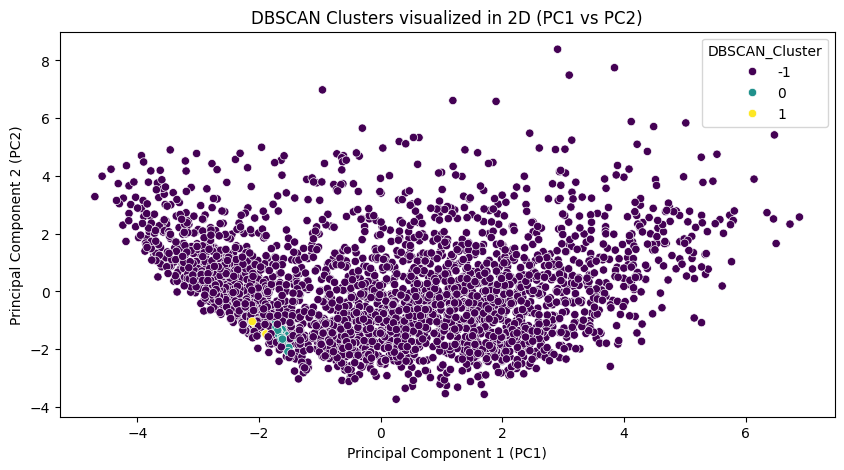

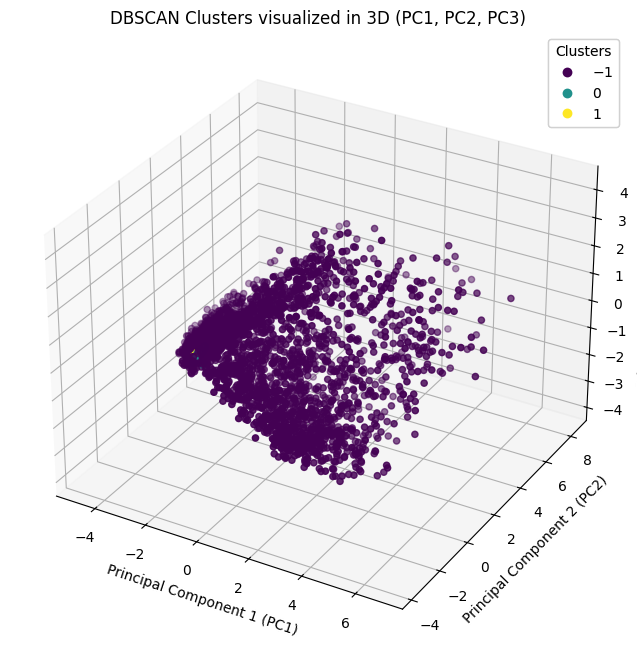

In [ ]:
# Visualize clusters in 2D using the first two principal components
plt.figure(figsize=(10, 5))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='DBSCAN_Cluster', palette='viridis', legend='full')
plt.title('DBSCAN Clusters visualized in 2D (PC1 vs PC2)')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.show()

# Visualize clusters in 3D using the first three principal components
if pca_df.shape[1] > 2:
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(pca_df['PC1'], pca_df['PC2'], pca_df['PC3'], c=pca_df['DBSCAN_Cluster'], cmap='viridis')
    ax.set_title('DBSCAN Clusters visualized in 3D (PC1, PC2, PC3)')
    ax.set_xlabel('Principal Component 1 (PC1)')
    ax.set_ylabel('Principal Component 2 (PC2)')
    ax.set_zlabel('Principal Component 3 (PC3)')
    legend = ax.legend(*scatter.legend_elements(), title="Clusters")
    ax.add_artist(legend)
    plt.show()
else:
    print("Cannot create a 3D visualization as there are fewer than 3 principal components.")


Visualize clusters in higher dimensions: Use techniques like t-SNE or UMAP to reduce the dimensionality of the data to 2D or 3D for visualization.

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


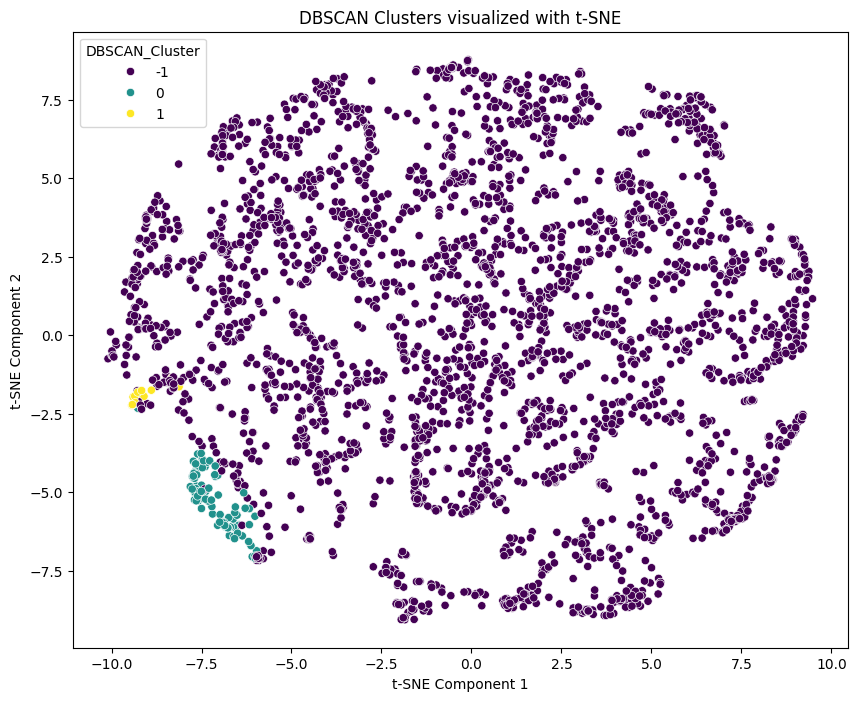

In [ ]:
from sklearn.manifold import TSNE

# Select the PCA components for t-SNE (exclude CUST_ID)
pca_data_for_tsne = pca_df.drop(columns=['CUST_ID', 'DBSCAN_Cluster'])


tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300)
tsne_results = tsne.fit_transform(pca_data_for_tsne)

# Create a DataFrame with the t-SNE results
tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE_PC1', 'TSNE_PC2'])

# Add the DBSCAN cluster labels to the t-SNE DataFrame
tsne_df['DBSCAN_Cluster'] = pca_df['DBSCAN_Cluster']

# Visualize the clusters in 2D using t-SNE
plt.figure(figsize=(10, 8))
sns.scatterplot(data=tsne_df, x='TSNE_PC1', y='TSNE_PC2', hue='DBSCAN_Cluster', palette='viridis', legend='full')
plt.title('DBSCAN Clusters visualized with t-SNE')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

Visualize cluster density: Create a density plot or heatmap to show the distribution of data points within each cluster and identify areas with high or low density.

/tmp/ipython-input-3272737032.py:13: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


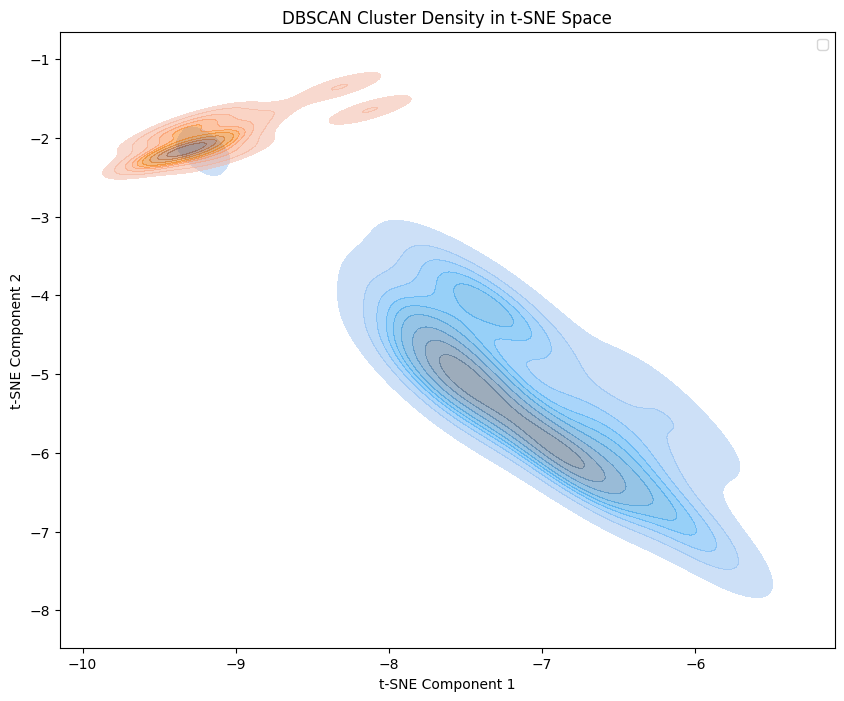

In [ ]:
# Visualize cluster density using density plots for each cluster in the t-SNE space
plt.figure(figsize=(10, 8))

# Iterate through each unique cluster label (excluding noise if desired)
for cluster_label in sorted(tsne_df['DBSCAN_Cluster'].unique()):
    if cluster_label != -1: # Exclude noise points from density plot
        cluster_data = tsne_df[tsne_df['DBSCAN_Cluster'] == cluster_label]
        sns.kdeplot(x=cluster_data['TSNE_PC1'], y=cluster_data['TSNE_PC2'], fill=True, label=f'Cluster {cluster_label}', alpha=0.5)

plt.title('DBSCAN Cluster Density in t-SNE Space')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend()
plt.show()

Visualize outliers: Identify and visualize outliers as points that are not assigned to any cluster.

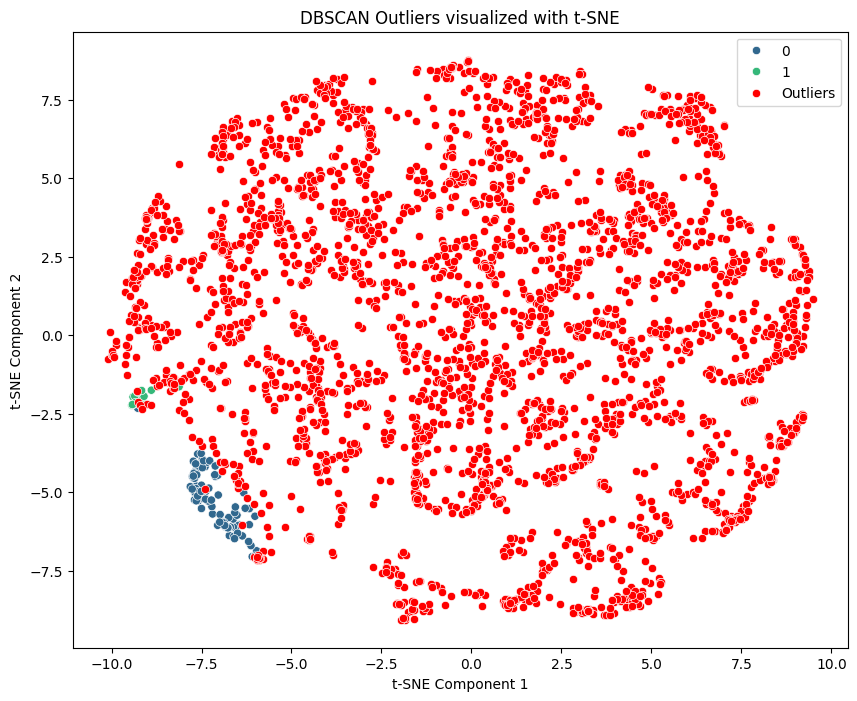

In [ ]:
# Visualize outliers (points with cluster label -1) in the t-SNE space
plt.figure(figsize=(10, 8))

# Separate outliers and clustered points
outliers_df = tsne_df[tsne_df['DBSCAN_Cluster'] == -1]
clustered_df = tsne_df[tsne_df['DBSCAN_Cluster'] != -1]

# Plot clustered points first
sns.scatterplot(data=clustered_df, x='TSNE_PC1', y='TSNE_PC2', hue='DBSCAN_Cluster', palette='viridis', legend='full')

# Plot outliers
sns.scatterplot(data=outliers_df, x='TSNE_PC1', y='TSNE_PC2', color='red', label='Outliers')

plt.title('DBSCAN Outliers visualized with t-SNE')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend()
plt.show()

## Other Clustering Techniques

### Hierarchical Clustering:

Choose a linkage method: Select an appropriate linkage method (e.g., single, complete, average, centroid) based on the desired cluster properties.

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt

# Select the data for hierarchical clustering (using the PCA-reduced data, excluding CUST_ID)
data_for_hierarchical_clustering = pca_df.drop(columns=['CUST_ID', 'DBSCAN_Cluster'])

# Choose a linkage method (e.g., 'ward', 'complete', 'average', 'single')
linkage_method = 'ward'

# Compute the linkage matrix
linked = linkage(data_for_hierarchical_clustering, method=linkage_method)



Construct the dendrogram: Create a dendrogram to visualize the hierarchical structure of the clusters.

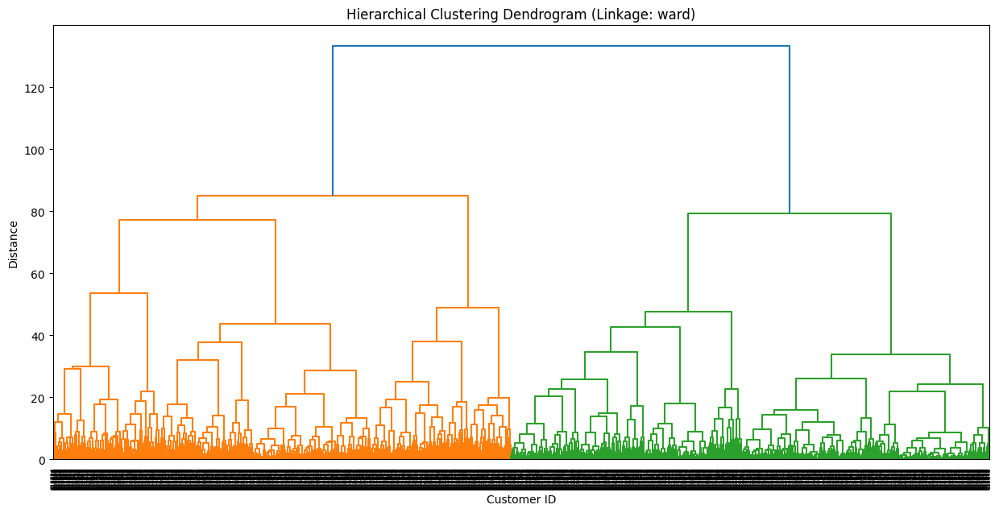

In [ ]:
# Plot the dendrogram
plt.figure(figsize=(15, 7))
dendrogram(linked,
           orientation='top',
           labels=pca_df['CUST_ID'].tolist(), # Optional: label leaves with CUST_ID
           distance_sort='descending',
           show_leaf_counts=True)
plt.title(f'Hierarchical Clustering Dendrogram (Linkage: {linkage_method})')
plt.xlabel('Customer ID')
plt.ylabel('Distance')
plt.show()

Determine the number of clusters: Decide on the number of clusters based on the dendrogram or using a cutoff value for the distance between clusters.

In [ ]:
#approximately 128

Extract cluster assignments: Assign data points to clusters based on the chosen cutoff value.

In [ ]:
# Type your code here

Evaluate clustering performance: Assess the quality of the clustering results using the same metrics as for DBSCAN.

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Select the data and hierarchical cluster labels
data_for_evaluation = data_for_hierarchical_clustering # Using the same PCA data as for clustering
hierarchical_labels = pca_df['Hierarchical_Cluster']

# Check if there are at least 2 clusters to calculate metrics
if len(set(hierarchical_labels)) > 1:
    # Calculate Silhouette Coefficient
    silhouette_avg_hierarchical = silhouette_score(data_for_evaluation, hierarchical_labels)
    print(f"Hierarchical Clustering - Silhouette Coefficient: {silhouette_avg_hierarchical:.4f}")

    # Calculate Calinski-Harabasz Index
    calinski_harabasz_hierarchical = calinski_harabasz_score(data_for_evaluation, hierarchical_labels)
    print(f"Hierarchical Clustering - Calinski-Harabasz Index: {calinski_harabasz_hierarchical:.4f}")

    # Calculate Davies-Bouldin Index
    davies_bouldin_hierarchical = davies_bouldin_score(data_for_evaluation, hierarchical_labels)
    print(f"Hierarchical Clustering - Davies-Bouldin Index: {davies_bouldin_hierarchical:.4f}")
else:
    print("Hierarchical clustering resulted in 1 cluster. Cannot compute all metrics.")
    print("Number of hierarchical clusters:", len(set(hierarchical_labels)))

Hierarchical Clustering - Silhouette Coefficient: 0.2014
Hierarchical Clustering - Calinski-Harabasz Index: 539.0925
Hierarchical Clustering - Davies-Bouldin Index: 2.0299


### Non-Hierarchical Clustering (K-means)

Choose the number of clusters: Determine the optimal number of clusters using techniques like the elbow method or silhouette analysis.

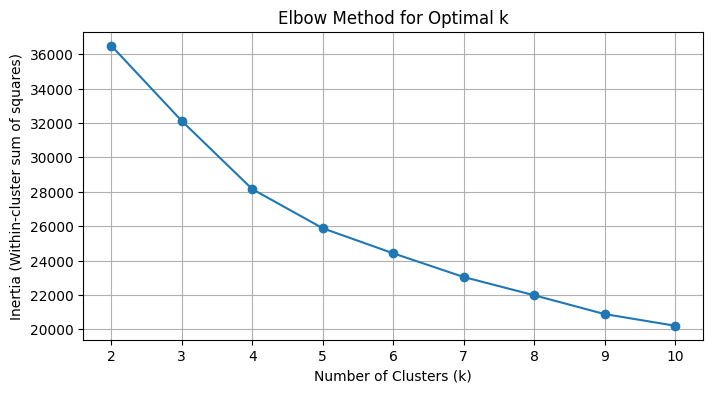

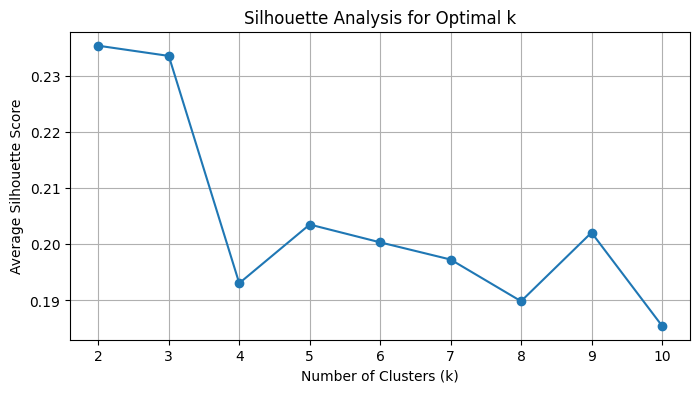

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Select the data for K-means clustering (using the PCA-reduced data, excluding CUST_ID and hierarchical clusters)
data_for_kmeans = pca_df.drop(columns=['CUST_ID', 'DBSCAN_Cluster', 'Hierarchical_Cluster'])

# Determine a range of k values to test
k_range = range(2, 11)  # Example: test k from 2 to 10

# Elbow Method
inertia = []
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10) # Add n_init for robustness
    kmeans.fit(data_for_kmeans)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(8, 4))
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (Within-cluster sum of squares)')
plt.xticks(k_range)
plt.grid(True)
plt.show()

# Silhouette Analysis
silhouette_scores = []
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10) # Add n_init for robustness
    cluster_labels = kmeans.fit_predict(data_for_kmeans)
    # Calculate silhouette score only if there is more than 1 cluster
    if len(set(cluster_labels)) > 1:
        score = silhouette_score(data_for_kmeans, cluster_labels)
        silhouette_scores.append(score)
    else:
        silhouette_scores.append(0) # Append 0 if only one cluster

# Plot the Silhouette Analysis graph
plt.figure(figsize=(8, 4))
plt.plot(k_range, silhouette_scores, marker='o')
plt.title('Silhouette Analysis for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.xticks(k_range)
plt.grid(True)
plt.show()

Initialize cluster centroids: Randomly select initial cluster centroids.

In [ ]:
from scipy.cluster.hierarchy import fcluster

# Replace 'num_clusters' with the desired number of clusters based on the dendrogram,
# or replace 't=num_clusters' with 't=cutoff_distance' and set 'criterion' accordingly
# e.g., cluster_labels_hierarchical = fcluster(linked, t=cutoff_distance, criterion='distance')
num_clusters = 3 # Example: Replace with the number of clusters determined from the dendrogram

cluster_labels_hierarchical = fcluster(linked, t=num_clusters, criterion='maxclust')

# Add the hierarchical cluster labels to the pca_df DataFrame for comparison
pca_df['Hierarchical_Cluster'] = cluster_labels_hierarchical

print("Hierarchical Cluster Labels:")
print(cluster_labels_hierarchical)
print("\nNumber of clusters found:", len(set(cluster_labels_hierarchical)))
display(pca_df.head())

Hierarchical Cluster Labels:
[3 1 3 ... 3 3 2]

Number of clusters found: 3


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,CUST_ID,DBSCAN_Cluster,Hierarchical_Cluster
0,-0.498935,-2.955371,0.655473,0.516205,0.305128,-0.438748,-2.076518,-0.590973,0.162357,0.145214,0.157885,0.056609,C10001,-1,3
1,-0.995255,-1.826865,0.754688,-0.800967,-0.203792,-0.536444,0.488736,-0.457329,-0.180015,0.047743,0.305721,0.201190,C10005,-1,1
2,1.970294,-0.304460,-1.938940,-1.328883,0.354225,-0.230179,-0.174952,-0.206917,-0.243446,0.038702,-0.452748,0.536978,C10008,-1,3
3,1.101136,0.089499,1.575017,-0.612493,0.714268,1.172825,0.414688,-0.668269,0.882325,0.057547,-0.720399,-0.175264,C10009,-1,3
4,-2.100789,0.300288,0.087286,-1.708637,1.018069,-0.846294,-0.016818,0.429579,0.249258,0.035637,0.067135,0.210125,C10015,-1,1


Assign data points to clusters: Assign each data point to the nearest cluster centroid.

In [ ]:
from sklearn.cluster import KMeans

# Select the data for K-means clustering (using the PCA-reduced data)
data_for_kmeans = pca_df.drop(columns=['CUST_ID', 'DBSCAN_Cluster', 'Hierarchical_Cluster'])

# Choose the number of clusters based on Elbow and Silhouette plots (e.g., k=4)
n_clusters_kmeans = 4

# Initialize KMeans with the chosen number of clusters
kmeans = KMeans(n_clusters=n_clusters_kmeans, random_state=42, n_init=10) # Add n_init for robustness



K-Means Cluster Labels (k=4):
[0 0 1 ... 1 1 1]

Number of K-Means clusters found: 4


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,CUST_ID,DBSCAN_Cluster,Hierarchical_Cluster,KMeans_Cluster
0,-0.498935,-2.955371,0.655473,0.516205,0.305128,-0.438748,-2.076518,-0.590973,0.162357,0.145214,0.157885,0.056609,C10001,-1,3,0
1,-0.995255,-1.826865,0.754688,-0.800967,-0.203792,-0.536444,0.488736,-0.457329,-0.180015,0.047743,0.305721,0.201190,C10005,-1,1,0
2,1.970294,-0.304460,-1.938940,-1.328883,0.354225,-0.230179,-0.174952,-0.206917,-0.243446,0.038702,-0.452748,0.536978,C10008,-1,3,1
3,1.101136,0.089499,1.575017,-0.612493,0.714268,1.172825,0.414688,-0.668269,0.882325,0.057547,-0.720399,-0.175264,C10009,-1,3,0
4,-2.100789,0.300288,0.087286,-1.708637,1.018069,-0.846294,-0.016818,0.429579,0.249258,0.035637,0.067135,0.210125,C10015,-1,1,0


Recompute cluster centroids: Calculate the new centroids for each cluster based on the assigned data points.

In [ ]:
# Fit the model and predict cluster assignments
cluster_labels_kmeans = kmeans.fit_predict(data_for_kmeans)

# Add the K-means cluster labels to the pca_df DataFrame for comparison
pca_df['KMeans_Cluster'] = cluster_labels_kmeans

print(f"K-Means Cluster Labels (k={n_clusters_kmeans}):")
print(cluster_labels_kmeans)
print("\nNumber of K-Means clusters found:", len(set(cluster_labels_kmeans)))
display(pca_df.head())

K-Means Cluster Labels (k=4):
[0 0 1 ... 1 1 1]

Number of K-Means clusters found: 4


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,CUST_ID,DBSCAN_Cluster,Hierarchical_Cluster,KMeans_Cluster
0,-0.498935,-2.955371,0.655473,0.516205,0.305128,-0.438748,-2.076518,-0.590973,0.162357,0.145214,0.157885,0.056609,C10001,-1,3,0
1,-0.995255,-1.826865,0.754688,-0.800967,-0.203792,-0.536444,0.488736,-0.457329,-0.180015,0.047743,0.305721,0.201190,C10005,-1,1,0
2,1.970294,-0.304460,-1.938940,-1.328883,0.354225,-0.230179,-0.174952,-0.206917,-0.243446,0.038702,-0.452748,0.536978,C10008,-1,3,1
3,1.101136,0.089499,1.575017,-0.612493,0.714268,1.172825,0.414688,-0.668269,0.882325,0.057547,-0.720399,-0.175264,C10009,-1,3,0
4,-2.100789,0.300288,0.087286,-1.708637,1.018069,-0.846294,-0.016818,0.429579,0.249258,0.035637,0.067135,0.210125,C10015,-1,1,0


Iterate until convergence: Repeat previous 2 steps until the cluster assignments stabilize or a maximum number of iterations is reached.

In [ ]:
cluster_labels_kmeans = kmeans.fit_predict(data_for_kmeans)

# Add the K-means cluster labels to the pca_df DataFrame for comparison
pca_df['KMeans_Cluster'] = cluster_labels_kmeans

Visualize cluster assignments: Plot the data points with different colors or markers to represent the cluster assignments from each clustering algorithm.

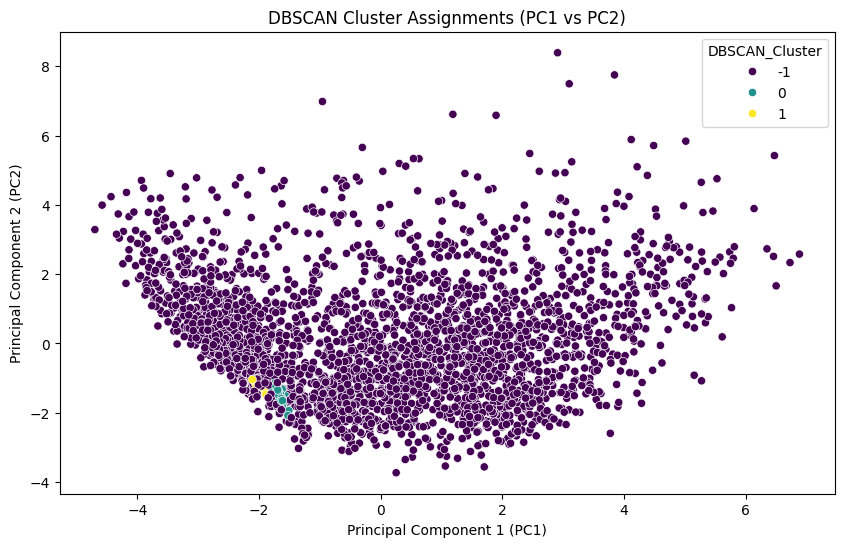

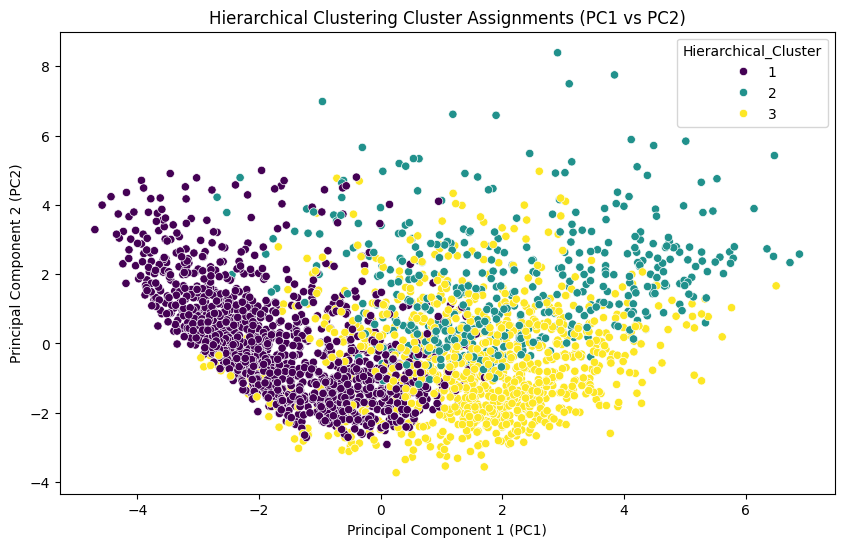

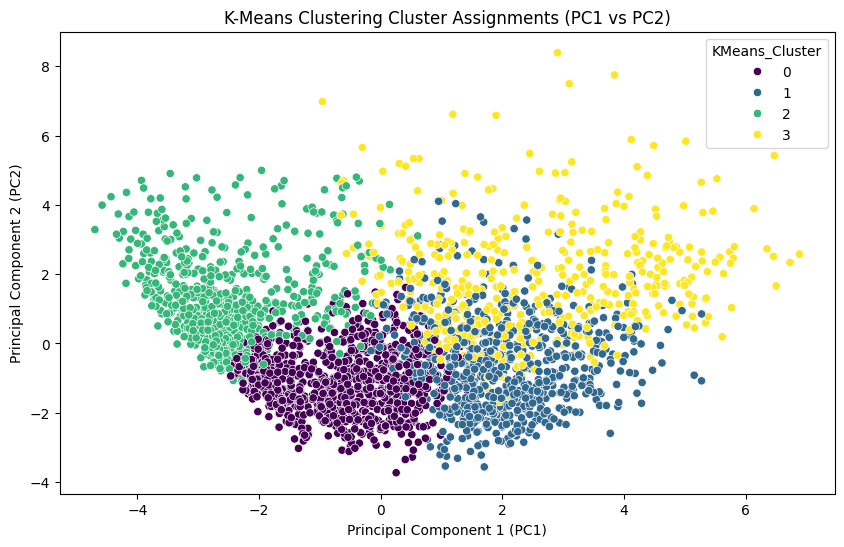

In [ ]:
# Visualize cluster assignments from DBSCAN in 2D (PC1 vs PC2)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='DBSCAN_Cluster', palette='viridis', legend='full')
plt.title('DBSCAN Cluster Assignments (PC1 vs PC2)')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.show()

# Visualize cluster assignments from Hierarchical Clustering in 2D (PC1 vs PC2)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Hierarchical_Cluster', palette='viridis', legend='full')
plt.title('Hierarchical Clustering Cluster Assignments (PC1 vs PC2)')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.show()

# Visualize cluster assignments from K-Means Clustering in 2D (PC1 vs PC2)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='KMeans_Cluster', palette='viridis', legend='full')
plt.title('K-Means Clustering Cluster Assignments (PC1 vs PC2)')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.show()

Compare clustering results: Analyze the similarities and differences between the clusters obtained from hierarchical, non-hierarchical, and DBSCAN.

In [ ]:
# For comparison, let's analyze the characteristics of each cluster
# by calculating the mean of the original features for each cluster.

# Combine original data with cluster labels
df_clustered = df_cleaned.copy()
df_clustered['DBSCAN_Cluster'] = pca_df['DBSCAN_Cluster']
df_clustered['Hierarchical_Cluster'] = pca_df['Hierarchical_Cluster']
df_clustered['KMeans_Cluster'] = pca_df['KMeans_Cluster']

# Analyze DBSCAN Clusters
print("--- DBSCAN Cluster Analysis (Mean of Original Features) ---")
# Exclude noise points (-1) from the analysis and exclude 'CUST_ID' from mean calculation
dbscan_cluster_analysis = df_clustered[df_clustered['DBSCAN_Cluster'] != -1].groupby('DBSCAN_Cluster').mean(numeric_only=True)
display(dbscan_cluster_analysis)

print("\n--- Hierarchical Clustering Analysis (Mean of Original Features) ---")
# Exclude 'CUST_ID' from mean calculation
hierarchical_cluster_analysis = df_clustered.groupby('Hierarchical_Cluster').mean(numeric_only=True)
display(hierarchical_cluster_analysis)

print("\n--- K-Means Clustering Analysis (Mean of Original Features) ---")
# Exclude 'CUST_ID' from mean calculation
kmeans_cluster_analysis = df_clustered.groupby('KMeans_Cluster').mean(numeric_only=True)
display(kmeans_cluster_analysis)

--- DBSCAN Cluster Analysis (Mean of Original Features) ---


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Hierarchical_Cluster,KMeans_Cluster
DBSCAN_Cluster,,,,,,,,,,,,,,,,,,,
0.0,1112.098944,0.978056,467.755862,303.300690,164.455172,465.773089,0.462644,0.166667,0.359195,0.123563,2.034483,9.931034,3524.137931,888.680293,373.707857,0.006270,12.0,1.0,0.0
1.0,1219.935814,0.954546,690.183333,452.953333,237.230000,0.000000,0.430556,0.222222,0.305556,0.000000,0.000000,10.000000,3016.666667,706.369537,495.990414,0.016667,12.0,1.0,0.0



--- Hierarchical Clustering Analysis (Mean of Original Features) ---


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,DBSCAN_Cluster,KMeans_Cluster
Hierarchical_Cluster,,,,,,,,,,,,,,,,,,,
1.0,1396.472550,0.980030,401.606423,227.576088,174.030335,392.360331,0.392608,0.125872,0.299163,0.102336,1.707113,8.000000,3748.535565,867.894897,517.785714,0.022952,12.0,-0.914226,0.884937
2.0,1425.810765,0.979725,412.425755,211.869424,200.556331,447.675398,0.381894,0.136691,0.282374,0.106715,1.741007,7.884892,4146.402878,939.919386,507.136692,0.018687,12.0,-1.000000,2.467626
3.0,1418.041332,0.978104,392.892073,215.249970,177.642104,451.642163,0.386179,0.126016,0.286331,0.096799,1.658537,7.588415,3789.024390,907.328416,497.887471,0.032516,12.0,-1.000000,1.106707



--- K-Means Clustering Analysis (Mean of Original Features) ---


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,DBSCAN_Cluster,Hierarchical_Cluster
KMeans_Cluster,,,,,,,,,,,,,,,,,,,
0.0,1418.170753,0.980749,367.660265,210.897471,156.762794,399.341568,0.370833,0.124510,0.276961,0.108088,1.802941,7.505882,3747.500000,846.258216,514.684788,0.020559,12.0,-0.879412,1.376471
1.0,1446.795762,0.974593,370.177336,192.834017,177.343319,463.856752,0.381368,0.116812,0.288210,0.096434,1.663755,7.502183,3662.008734,884.299342,497.175234,0.027865,12.0,-1.000000,2.921397
2.0,1366.601487,0.981260,434.795658,248.652588,186.143070,434.176692,0.404605,0.130848,0.304094,0.100146,1.701754,8.412281,3792.763158,901.537499,520.846085,0.030815,12.0,-1.000000,1.228070
3.0,1390.133158,0.980344,467.940135,245.110068,222.830068,384.609005,0.417230,0.145833,0.315315,0.093468,1.486486,8.250000,4280.067568,995.428264,497.985123,0.025925,12.0,-1.000000,2.182432


Evaluate clustering performance: Compare the clustering performance metrics (e.g., silhouette coefficient, Calinski-Harabasz index) for each algorithm.

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Select the data and K-Means cluster labels
data_for_evaluation_kmeans = data_for_kmeans # Using the same PCA data as for clustering
kmeans_labels = pca_df['KMeans_Cluster']

# Check if there are at least 2 clusters to calculate metrics
if len(set(kmeans_labels)) > 1:
    # Calculate Silhouette Coefficient
    silhouette_avg_kmeans = silhouette_score(data_for_evaluation_kmeans, kmeans_labels)
    print(f"K-Means Clustering - Silhouette Coefficient: {silhouette_avg_kmeans:.4f}")

    # Calculate Calinski-Harabasz Index
    calinski_harabasz_kmeans = calinski_harabasz_score(data_for_evaluation_kmeans, kmeans_labels)
    print(f"K-Means Clustering - Calinski-Harabasz Index: {calinski_harabasz_kmeans:.4f}")

    # Calculate Davies-Bouldin Index
    davies_bouldin_kmeans = davies_bouldin_score(data_for_evaluation_kmeans, kmeans_labels)
    print(f"K-Means Clustering - Davies-Bouldin Index: {davies_bouldin_kmeans:.4f}")
else:
    print("K-Means clustering resulted in 1 cluster. Cannot compute all metrics.")
    print("Number of K-Means clusters:", len(set(kmeans_labels)))

K-Means Clustering - Silhouette Coefficient: 0.1931
K-Means Clustering - Calinski-Harabasz Index: 674.4839
K-Means Clustering - Davies-Bouldin Index: 1.6863


Identify strengths and weaknesses: Determine the strengths and weaknesses of each clustering algorithm based on the results and the characteristics of the data.

DBSCAN

Advantages: Capable of detecting clusters of various shapes, does not require predefining the number of clusters, and can naturally identify outliers.

Limitations: Results depend heavily on the chosen parameters (eps and min_samples), may have difficulty handling clusters with different densities, and performance can drop in high-dimensional datasets (though applying PCA can help).

Hierarchical Clustering

Advantages: Produces a hierarchy of clusters (dendrogram) that can give valuable insights, does not need the number of clusters to be set in advance (though a cutoff point is needed), and is often easier to interpret for smaller datasets.

Limitations: Computationally intensive for large datasets, the selected linkage method can change results significantly, and it can be sensitive to noise and outliers.

K-Means

Advantages: Simple to implement, fast, and efficient for spherical, similarly sized clusters; easy to understand and widely used.

Limitations: Requires the number of clusters to be specified beforehand, sensitive to the initial placement of centroids (though using n_init can reduce this issue), assumes clusters have spherical shapes and equal variance, and is affected by outliers.

Choose the best algorithm: Select the clustering algorithm that provides the most meaningful and accurate results for the specific problem.

DBSCAN is a strong candidate when the dataset contains a significant amount of noise or when clusters have irregular shapes and sizes. It can automatically detect outliers and does not require specifying the number of clusters beforehand, making it ideal for exploratory analysis in noisy environments.

K-Means is more appropriate when the data forms relatively compact, spherical clusters and the number of clusters is known in advance. It is efficient and works well for non-hierarchical grouping tasks where the clusters are roughly equal in size and variance.

